# **Usefull functions**

In [1]:
!pip install category_encoders
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from itertools import product
from sklearn.preprocessing import *
from sklearn.metrics import *
import category_encoders as ce
import sklearn
sklearn.set_config(transform_output="pandas")
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, validation_curve
from sklearn.linear_model import Ridge
import warnings
warnings.simplefilter("ignore")
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import seaborn as sns
import pickle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 1.9 MB/s eta 0:00:00


In [2]:
def hyper_tuning_curve(hyper_space, train_scores, validation_scores, method='Error'):
    mean_training_score = np.mean(train_scores, 0)
    std_training_score = np.std(train_scores, 0)
    mean_validation_score = np.mean(validation_scores, 0)
    std_validation_score = np.std(validation_scores, 0)

    sns.set_context('poster')

    plt.ion()
    plt.figure()
    plt.plot(hyper_space, mean_training_score, label='Training '+method)
    plt.plot(hyper_space, mean_validation_score, label='Validation '+method)
    plt.legend()
    plt.xlabel('Regualization factor')
    plt.ylabel(method)
    plt.title("Validation Curve")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()

def hyper_tuning_curve_best(hyper_space, train_scores, validation_scores, method='Error'):
    sns.set_context('poster')
    plt.ion()
    plt.figure()
    plt.plot(hyper_space, train_scores, label='Training '+method)
    plt.plot(hyper_space, validation_scores, label='Validation '+method)
    plt.legend()
    plt.xlabel('Regualization factor')
    plt.ylabel(method)
    plt.title("Validation Curve")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()

def hyper_tuning_curve_3D(hyper_space, train_scores, validation_scores, method='Error'):
    alpha_mesh, gamma_mesh = np.meshgrid(np.unique(hyper_space[:,0]), np.unique(hyper_space[:,1]))
    #training_scores_grid = train_scores.reshape(len(hyper_space), len(hyper_space))
    #validation_scores_grid = validation_scores.reshape(len(hyper_space), len(hyper_space))
    plt.ion()
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(alpha_mesh, gamma_mesh, train_scores.reshape(alpha_mesh.shape), cmap='viridis', label='Training Scores')
    ax.plot_surface(alpha_mesh, gamma_mesh, validation_scores.reshape(alpha_mesh.shape), cmap='plasma', label='Validation Scores')
    ax.set_xlabel('Alpha')
    ax.set_ylabel('Gamma')
    ax.set_zlabel(method)
    ax.set_title('3D Validation Curve')
    plt.show()
    with open('3d_kernel_valcurve.pickle', 'wb') as f:
        pickle.dump(fig, f)


def plot_learning_curve(train_sizes, train_scores, test_scores, method='Error'):
    sns.set_context('poster')
    plt.ion()
    plt.figure()
    plt.title("Learning Curve")
    plt.xlabel("Training set size")
    plt.ylabel(method)
    plt.plot(train_sizes, train_scores, color="r", label="Training "+method)
    plt.plot(train_sizes, test_scores, color="g", label="Test "+method)
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()

def plot_hyperparam_curve(ms, hyper_spaces):
    sns.set_context('poster')
    plt.ion()
    plt.figure()  # Imposta la dimensione della figura
    plt.title("Hyperparameters Curve")
    for i, hyper in enumerate(hyper_spaces):
        c = 0.8 - 0.15*i
        s = 25 - 5*i
        #plt.scatter(ms, hyper, c=[c], cmap=cm.gray, s=point_size, label=f'Fold {i}')
        plt.plot(ms, hyper, 'o', markersize=s, color=(c, c, c), label=f'Fold {i}')
        #plt.plot(ms, hyper, 'o', label=f'Fold {i}')
    plt.xlabel('Training set size')  # Etichetta dell'asse x
    plt.ylabel('Hyper values')  # Etichetta dell'asse y
    plt.legend()  # Mostra le legende per le righe
    plt.grid(True)
    plt.show()  # Mostra il grafico



def plot_linear_predictor(X, y, w, size, caption=None):
    d = X.shape[1]  # Number of features
    M = int(np.ceil(np.sqrt(d)))  # Number of rows in the subplot grid
    N = int(np.ceil(d / M))  # Number of columns in the subplot grid

    features = X.columns.tolist()

    fig, axes = plt.subplots(M, N, figsize=(15, 10))

    fig.suptitle('Linear Predictor (fold n.'+str(caption[0]+1)+', '+str(caption[1])+')')

    np.random.seed(42)

    for i, ax in enumerate(axes.flat):
        if i < d:
            feature = X[features[i]].to_numpy()
            target = y.to_numpy()
            indices = np.random.choice(feature.shape[0], size=size, replace=False)
            sampled_feature = feature[indices]
            sampled_target = target[indices]
            ax.scatter(sampled_feature, sampled_target, color='blue', alpha=0.5, label='Data Points')
            #ax.plot(feature, w[0] + w[i+1] * feature, color='red', label='Predictor')
            x1 = feature.min()
            y1 = w[0]
            x2 = feature.max()
            y2 = w[0] + x2 * w[i+1]
            ax.plot([x1, x2], [y1, y2], color='red')
            ax.set_xlabel(f'Feature {i+1}: '+features[i])
            ax.set_ylabel('Target: '+y.columns.tolist()[0])
            ax.legend()

        ax.set_xticks([])
        ax.set_yticks([])

    plt.ion()
    plt.tight_layout()
    plt.show()

def plot_histo(X, features, caption):
    # Plot the distribution of the numerical features (on a stample of 10000 examples)
    plt.ion()
    if len(features)/2 > 2:
        if len(features)%2 == 0:
            fig, axes = plt.subplots(nrows=2, ncols=int(len(features)/2), figsize=(18, 6))
        else:
            fig, axes = plt.subplots(nrows=2, ncols=int(len(features)/2)+1, figsize=(18, 6))
    else:
        if len(features)==1:
            fig, ax = plt.subplots(figsize=(18, 6))
        else:
            fig, axes = plt.subplots(nrows=1, ncols=int(len(features)), figsize=(18, 6))
    fig.suptitle(caption)
    if len(features)==1:
        sns.histplot(data=X[features], x=features[0])
    else:
        axes = axes.flatten()  # Appiattisci la matrice di assi per facilitare l'iterazione
        for i, col in enumerate(features):
            sns.histplot(data=X[features], x=col, ax=axes[i])
    plt.tight_layout()
    plt.show()

def plot_correlation_full(df):
    plt.ion()
    corr = np.abs(df.corr())
    fig, ax = plt.subplots(figsize=(8, 8))
    cmap = sns.color_palette("Reds")
    sns.heatmap(corr, cmap=cmap, square=True)
    plt.title('Linear correlation between features (absolute values)')
    plt.tight_layout()
    plt.show()
    corr = corr[['popularity']].sort_values(by='popularity', ascending=False)
    plt.figure(figsize=(8, 12))
    heatmap = sns.heatmap(corr, annot=True, cmap='Reds')
    heatmap.set_title('Target-correlated features', fontdict={'fontsize':18}, pad=16)


def find_nearest_divisor(N, v):
    nearest_divisor = None
    min_difference = float('inf')
    for divisor in range(1, N + 1):
        if N % divisor == 0:
            difference = abs(v - divisor)
            if difference < min_difference:
                min_difference = difference
                nearest_divisor = divisor

    return nearest_divisor

def df_to_latex_table(df, path):
    latex_table = df.to_latex(index=False, escape=False)
    latex_table = latex_table.replace('\n', '')
    with open(path, 'w') as file:
        file.write(latex_table)


In [3]:
class TargetEncoding:

    def __init__(self, target_col, encoding_type, smoothing=0, default_shrink=1/6):
        self.target_col = target_col
        self.encoding_type = encoding_type
        self.smoothing = smoothing
        self.default_shrink = default_shrink
        self.encoding_params = []
        self.defaults = []


    def fit_transform(self, data, encoding_cols):
        self.encoding_params = []
        for col in encoding_cols:
            center_index = self.compute_center_index(data, col)
            self.encoding_params.append(center_index)
            self.defaults.append(self.default_shrink*np.percentile(center_index.to_numpy(), 10))
        for i, col in enumerate(encoding_cols):
            data[col] = data[col].map(self.encoding_params[i])
            if (data[col] == 0).sum() > 0:
                data[col].replace(to_replace = 0, value = 0.001, inplace=True)
        return data[encoding_cols]


    def transform(self, data, encoding_cols):
        for i, col in enumerate(encoding_cols):
            data[col] = data[col].map(self.encoding_params[i]).fillna(self.defaults[i])
            if (data[col] == 0).sum() > 0:
                data[col].replace(to_replace = 0, value = 0.001, inplace=True)
        return data[encoding_cols]


    def compute_center_index(self, data, col):
        data_grouped = data.groupby(col)[self.target_col]
        prior_mean = data[self.target_col].mean().squeeze()
        prior_count = data_grouped.count().squeeze()
        if self.encoding_type == 'mean' :
            center_index_est = data_grouped.mean().squeeze()
        elif self.encoding_type == 'median':
            center_index_est = data_grouped.median().squeeze()
        else:
            raise ValueError("Invalid encoding_type. Supported values: 'median', 'mean'")
        return (prior_count * center_index_est + self.smoothing * prior_mean) / (prior_count + self.smoothing)


    def get_encoding_params(self):
        return self.encoding_params

    def get_encoding_type(self):
        return self.encoding_type

    def get_target_col(self):
        return self.target_col

# **Expected risk estimate class:**

1.   Provides a function to compute the nested CV for the hyperparameter tuning (internal CV) and the risk estimate (external CV)
2.   Includes a function to compute the best CV estimate over a family of learning algorithms parametrized by different tuples of hyperparameters



In [4]:
from sklearn.preprocessing import *
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import inspect


class expectedRiskEstimate:

    def __init__(self, K, model, scalers=None, encoders=None, features=None, target=None, evaluation=mean_squared_error, sample_tollerance=4000, dc_applied=False, verbose=False, visualize=False):
        self.K = K
        self.model = model
        self.scalers = scalers
        self.encoders = encoders
        self.target = target
        self.features = features
        self.evaluation = evaluation
        self.val_training_errors = []
        self.validation_errors = []
        self.training_errors = []
        self.test_errors = []
        self.mean_training_error = 0
        self.risk_esimate = 0
        self.hyper_opt = []
        self.predictors = []
        self.learningC_train = []
        self.learningC_test = []
        self.learningC_hyper = []
        self.learningC_model = []
        self.learningC_ms = []
        self.sample_tollerance = sample_tollerance
        self.dc_applied = dc_applied
        self.verbose = verbose
        self.visualize = visualize
        self.is_first_call = True


    def nestedKFoldCV(self, X, y, hyper_space):

        self.val_training_errors = []
        self.validation_errors = []
        self.training_errors = []
        self.test_errors = []
        self.hyper_opt = []
        self.predictors = []

        sample_size = X.shape[0]
        fold_size = sample_size // self.K
        m = sample_size * (self.K-1) // self.K
        val_size = int(0.2 * m)

        X_folds = np.array_split(X, self.K)
        y_folds = np.array_split(y, self.K)

        for i in range(self.K):

            if self.verbose :
                print("\n==========================Processing "+str(i)+"-th Fold==========================")
            X_train_full = pd.concat(X_folds[:i]+X_folds[i+1:]).copy()
            y_train_full = pd.concat(y_folds[:i]+y_folds[i+1:]).copy()

            X_train = X_train_full[:m - val_size].copy()
            X_validation = X_train_full[m - val_size:].copy()
            X_test = X_folds[i].copy()
            y_train = y_train_full[:m - val_size].copy()
            y_validation = y_train_full[m - val_size:].copy()
            y_test = y_folds[i].copy()

            new_columns_print = []

            if self.encoders is not None :
                for features, encoder in self.encoders.items():
                    if isinstance(features, str):
                        encoder = self.encoders[features]
                        features = [features]
                    else:
                        features = list(features)
                    if isinstance(encoder, TargetEncoding):
                        X_train[features] = encoder.fit_transform(pd.concat([X_train, y_train], axis=1), encoding_cols=features)
                        X_validation[features] = encoder.transform(X_validation, encoding_cols=features)
                        X_train_full[features] = encoder.fit_transform(pd.concat([X_train_full, y_train_full], axis=1), encoding_cols=features)
                        X_test[features] = encoder.transform(X_test, encoding_cols=features)
                    elif isinstance(encoder, OneHotEncoder) or (isinstance(encoder, ce.BaseNEncoder) and encoder.get_params()['base']==2):
                        X_train = X_train.drop(columns=features).assign(**encoder.fit_transform(X_train[features]))
                        X_validation = X_validation.drop(columns=features).assign(**encoder.transform(X_validation[features]))
                        X_train_full = X_train_full.drop(columns=features).assign(**encoder.fit_transform(X_train_full[features]))
                        X_test = X_test.drop(columns=features).assign(**encoder.transform(X_test[features]))
                        self.features = list(X_train.columns)
                    elif isinstance(encoder, ce.WOEEncoder):
                        X_train[features] = encoder.fit_transform(X_train[features], y_train)
                        X_validation[features] = encoder.transform(X_validation[features], y_validation)
                        X_train_full[features] = encoder.fit_transform(X_train_full[features], y_train_full)
                        X_test[features] = encoder.transform(X_test[features], y_test)
                    else:
                        transform_train = encoder.fit_transform(X_train[features])
                        X_train = X_train.drop(columns=features).assign(**transform_train)
                        X_validation = X_validation.drop(columns=features).assign(**encoder.transform(X_validation[features]))
                        X_train_full = X_train_full.drop(columns=features).assign(**encoder.fit_transform(X_train_full[features]))
                        X_test = X_test.drop(columns=features).assign(**encoder.transform(X_test[features]))
                        self.features = list(X_train.columns)
                        new_columns = transform_train.columns.tolist()
                        new_columns_print += new_columns
                        if self.scalers is not None and i==0 and self.is_first_call:
                            old_columns = list(list(self.scalers.keys())[0])
                            value = next(iter(self.scalers.values()))
                            del self.scalers[tuple(old_columns)]
                            for feature in features:
                                old_columns.remove(feature)
                            comb_columns = old_columns + new_columns
                            self.scalers[tuple(comb_columns)] = value

            if(inspect.currentframe().f_back.f_code.co_name == 'learningCurveCV'):
                self.is_first_call = False

            if self.visualize and i==0:
                if self.encoders is None:
                    plot_histo(pd.concat([X_train, y_train], axis=1), self.features+self.target, caption='Features histograms')
                elif not isinstance(encoder, OneHotEncoder) and not isinstance(encoder, ce.BaseNEncoder):
                    plot_histo(X_train[new_columns_print], new_columns_print, caption='Features histograms (categorical)')


            if self.scalers is not None:
                for features, scaler in self.scalers.items():
                    feat = list(features)
                    if self.target[0] in features:
                        feat.remove(self.target[0])
                    X_train[feat] = scaler.fit_transform(X_train[feat])
                    X_validation[feat] = scaler.transform(X_validation[feat])
                    if self.target[0] in features:
                        y_train = scaler.fit_transform(y_train)
                        y_validation = scaler.transform(y_validation)
                    X_train_full[feat] = scaler.fit_transform(X_train_full[feat])
                    X_test[feat] = scaler.transform(X_test[feat])
                    if self.target[0] in features:
                        y_train_full = scaler.fit_transform(y_train_full)
                        y_test = scaler.transform(y_test)

            if self.visualize and i==0:
                if self.encoders is None:
                    plot_histo(pd.concat([X_train, y_train], axis=1), self.features+self.target, caption='Encoded and scaled features histograms')
                elif not isinstance(encoder, OneHotEncoder) and not isinstance(encoder, ce.BaseNEncoder):
                    plot_histo(X_train[new_columns_print], new_columns_print, caption='Encoded and scaled features histograms (categorical)')

            if self.dc_applied :
                num_subsets_candidate_train = int(X_train.shape[0]/self.sample_tollerance)
                num_subsests_train = find_nearest_divisor(X_train.shape[0], num_subsets_candidate_train)
                num_subsets_candidate_train_full = int(X_train_full.shape[0]/self.sample_tollerance)
                num_subsests_train_full = find_nearest_divisor(X_train_full.shape[0], num_subsets_candidate_train_full)

            val_training_scores = []
            validation_scores = []
            inter_val_training_scores = []
            inter_test_scores = []

            for j, alpha in enumerate(hyper_space) :
                if self.verbose :
                    print("\n----------------------Validate  "+str(i)+"-th Fold with regularization: "+str(alpha)+" -------------------------")

                model = self.model(alpha=alpha)
                if self.dc_applied :
                    model.set_num_subsets(num_subsests_train)
                    model.set_verbose(self.verbose)
                model.fit(X_train, y_train)
                val_training_scores.append(model.score(X_train, y_train, method=self.evaluation))
                validation_scores.append(model.score(X_validation, y_validation, method=self.evaluation))

                #---------additional part for plots-------------
                model = self.model(alpha=alpha)
                if self.dc_applied :
                    model.set_num_subsets(num_subsests_train_full)
                    model.set_verbose(self.verbose)
                model.fit(X_train_full, y_train_full)
                inter_val_training_scores.append(model.score(X_train_full, y_train_full, method=self.evaluation))
                inter_test_scores.append(model.score(X_test, y_test, method=self.evaluation))

            self.val_training_errors.append(inter_val_training_scores)
            self.validation_errors.append(inter_test_scores)

            if self.evaluation == mean_squared_error:
                self.hyper_opt.append(hyper_space[np.argmin(validation_scores)])
            elif self.evaluation == r2_score:
                self.hyper_opt.append(hyper_space[np.argmax(validation_scores)])

            if self.verbose :
                print("\n----------------------Test  "+str(i)+"-th Fold with regularization: "+str(self.hyper_opt[i])+" -------------------------")

            model_opt = self.model(alpha=self.hyper_opt[i])
            if self.dc_applied :
                    model_opt.set_num_subsets(num_subsests_train_full)
                    model_opt.set_verbose(self.verbose)
            model_opt.fit(X_train_full, y_train_full)
            self.predictors.append(model_opt.get_w())
            self.training_errors.append(model_opt.score(X_train_full, y_train_full, method=self.evaluation))
            self.test_errors.append(model_opt.score(X_test, y_test, method=self.evaluation))

            if self.visualize and hyper_space.ndim==1:
                #plot_linear_predictor(X_train_full, y_train_full, model_opt.get_w(), caption=[i, 'Training'])
                plot_linear_predictor(X_test, y_test, model_opt.get_w(), fold_size//16, caption=[i, 'Test'])

        #import code;
        #code.interact(local=locals())

        if self.visualize and hyper_space.ndim==1:
            if self.evaluation == mean_squared_error:
                    hyper_tuning_curve(hyper_space, np.array(self.val_training_errors), np.array(self.validation_errors), 'Error')
            elif self.evaluation == r2_score:
                    hyper_tuning_curve(hyper_space, np.array(self.val_training_errors), np.array(self.validation_errors), 'Accuracy')
        elif self.visualize and hyper_space.ndim==2:
            if self.evaluation == mean_squared_error:
                hyper_tuning_curve_3D(hyper_space, np.array(self.val_training_errors), np.array(self.validation_errors), method='Error')
            elif self.evaluation == r2_score:
                hyper_tuning_curve_3D(hyper_space, np.array(self.val_training_errors), np.array(self.validation_errors), method='Accuracy')


        self.mean_training_error = sum(self.training_errors)/self.K
        self.risk_esimate = sum(self.test_errors)/self.K
        return self.mean_training_error, self.risk_esimate, self.hyper_opt, self.predictors, m




    def bestCV(self, X, y, hyper_space):

        self.training_errors = []
        self.test_errors = []

        sample_size = X.shape[0]
        fold_size = sample_size // self.K
        m = sample_size * (self.K-1) // self.K

        X_folds = np.array_split(X, self.K)
        y_folds = np.array_split(y, self.K)

        self.hyper_opt = 0

        X_train_full = []
        y_train_full = []
        X_test = []
        y_test = []

        num_subsests_train_full = []

        for i in range(self.K):

            if self.verbose :
                print("\n==========================Create "+str(i)+"-th Fold==========================")

            X_train_full.append(pd.concat(X_folds[:i]+X_folds[i+1:]).copy())
            y_train_full.append(pd.concat(y_folds[:i]+y_folds[i+1:]).copy())
            X_test.append(X_folds[i].copy())
            y_test.append(y_folds[i].copy())

        for i in range(self.K):

            if self.verbose :
                print("\n==========================Pre-processing "+str(i)+"-th Fold==========================")

            new_columns_print = []

            if self.encoders is not None :
                for features, encoder in self.encoders.items():
                    if isinstance(features, str):
                        encoder = self.encoders[features]
                        features = [features]
                    else:
                        features = list(features)
                    if isinstance(encoder, TargetEncoding):
                        X_train_full[i][features] = encoder.fit_transform(pd.concat([X_train_full[i], y_train_full[i]], axis=1), encoding_cols=features)
                        X_test[i][features] = encoder.transform(X_test[i], encoding_cols=features)
                    elif isinstance(encoder, OneHotEncoder) or (isinstance(encoder, ce.BaseNEncoder) and encoder.get_params()['base']==2):
                        X_train_full[i] = X_train_full[i].drop(columns=features).assign(**encoder.fit_transform(X_train_full[i][features]))
                        X_test[i] = X_test[i].drop(columns=features).assign(**encoder.transform(X_test[i][features]))
                        self.features = list(X_train_full[i].columns)
                    elif isinstance(encoder, ce.WOEEncoder):
                        X_train_full[i][features] = encoder.fit_transform(X_train_full[i][features], y_train_full[i])
                        X_test[i][features] = encoder.transform(X_test[i][features], y_test[i])
                    else:
                        transform_train = encoder.fit_transform(X_train_full[i][features])
                        X_train_full[i] = X_train_full[i].drop(columns=features).assign(**encoder.fit_transform(X_train_full[i][features]))
                        X_test[i] = X_test[i].drop(columns=features).assign(**encoder.transform(X_test[i][features]))
                        self.features = list(X_train_full[i].columns)
                        new_columns = transform_train.columns.tolist()
                        new_columns_print += new_columns
                        if self.scalers is not None and i==0 and self.is_first_call:
                            old_columns = list(list(self.scalers.keys())[0])
                            value = next(iter(self.scalers.values()))
                            del self.scalers[tuple(old_columns)]
                            for feature in features:
                                old_columns.remove(feature)
                            comb_columns = old_columns + new_columns
                            self.scalers[tuple(comb_columns)] = value

            if(inspect.currentframe().f_back.f_code.co_name == 'learningCurveCV'):
                self.is_first_call = False

            if self.visualize and i==0:
                if self.encoders is None:
                    plot_histo(pd.concat([X_train_full[i], y_train_full[i]], axis=1), self.features+self.target, caption='Features histograms')
                elif not isinstance(encoder, OneHotEncoder) and not isinstance(encoder, ce.BaseNEncoder):
                    plot_histo(X_train_full[i][new_columns_print], new_columns_print, caption='Features histograms (categorical)')


            if self.scalers is not None:
                for features, scaler in self.scalers.items():
                    feat = list(features)
                    if self.target[0] in features:
                        feat.remove(self.target[0])
                    X_train_full[i][feat] = scaler.fit_transform(X_train_full[i][feat])
                    X_test[i][feat] = scaler.transform(X_test[i][feat])
                    if self.target[0] in features:
                        y_train_full[i] = scaler.fit_transform(y_train_full[i])
                        y_test[i] = scaler.transform(y_test[i])

            if self.visualize and i==0:
                if self.encoders is None:
                    plot_histo(pd.concat([X_train_full[i], y_train_full[i]], axis=1), self.features+self.target, caption='Encoded and scaled features histograms')
                elif not isinstance(encoder, OneHotEncoder) and not isinstance(encoder, ce.BaseNEncoder):
                    plot_histo(X_train_full[i][new_columns_print], new_columns_print, caption='Encoded and scaled features histograms (categorical)')

        models = []

        for j, alpha in enumerate(hyper_space) :

            inter_training_scores = []
            inter_test_scores = []
            inter_model = []

            for i in range(self.K):

                if self.verbose :
                    print("\n----------------------Test  "+str(i)+"-th Fold with regularization: "+str(alpha)+" -------------------------")

                model = self.model(alpha=alpha)
                if self.dc_applied and isinstance(model, DCKRR):
                        num_subsets_candidate_train_full = int(X_train_full[i].shape[0]/self.sample_tollerance)
                        num_subsests_train_full.append(find_nearest_divisor(X_train_full[i].shape[0], num_subsets_candidate_train_full))
                        model.set_num_subsets(num_subsests_train_full[i])
                        model.set_verbose(self.verbose)
                if self.dc_applied and isinstance(model, KernelRidgeRegression):
                    model.set_apply_nystrom(True)
                model.fit(X_train_full[i], y_train_full[i])
                inter_model.append(model.get_w())
                inter_training_scores.append(model.score(X_train_full[i], y_train_full[i], method=self.evaluation))
                inter_test_scores.append(model.score(X_test[i], y_test[i], method=self.evaluation))

            models.append(inter_model)
            self.training_errors.append(sum(inter_training_scores)/self.K)
            self.test_errors.append(sum(inter_test_scores)/self.K)

        if self.evaluation == mean_squared_error:
            self.hyper_opt = hyper_space[np.argmin(self.test_errors)]
            self.predictors = models[np.argmin(self.test_errors)]
            self.mean_training_error = self.training_errors[np.argmin(self.test_errors)]
            self.risk_esimate = np.min(self.test_errors)
        elif self.evaluation == r2_score:
            self.hyper_opt = hyper_space[np.argmax(self.test_errors)]
            self.predictors = models[np.argmax(self.test_errors)]
            self.mean_training_error = self.training_errors[np.argmax(self.test_errors)]
            self.risk_esimate = np.max(self.test_errors)

        if self.visualize and hyper_space.ndim==1:
            plot_linear_predictor(X_test[0], y_test[0], self.predictors[0], fold_size//16, caption=[0, 'Test'])

        if self.visualize and hyper_space.ndim==1:
            if self.evaluation == mean_squared_error:
                    hyper_tuning_curve_best(hyper_space, np.array(self.training_errors), np.array(self.test_errors), 'Error')
            elif self.evaluation == r2_score:
                    hyper_tuning_curve_best(hyper_space, np.array(self.training_errors), np.array(self.test_errors), 'Accuracy')
        elif self.visualize and hyper_space.ndim==2:
            if isinstance(model, KernelRidgeRegression):
                unique_gammas = np.unique(hyper_space[:, 1], return_index=False)
                unique_alphas = np.unique(hyper_space[:,0], return_index=False)
                alphas = []
                trains = []
                tests = []
                opt_trains = []
                opt_tests = []
                opt_alpha = []
                for i, gamma in enumerate(unique_gammas):
                    indices = np.where(hyper_space[:, 1] == gamma)[0]
                    trains.append(np.array(self.training_errors)[indices])
                    tests.append(np.array(self.test_errors)[indices])
                    alphas.append(unique_alphas)
                    if self.evaluation == mean_squared_error:
                        opt_trains.append(np.min(trains[i]))
                        opt_tests.append(np.min(tests[i]))
                        opt_alpha.append(unique_alphas[np.argmin(tests[i])])
                        hyper_tuning_curve_best(alphas[i], trains[i], tests[i], 'Error')
                    elif self.evaluation == r2_score:
                        opt_trains.append(np.max(trains[i]))
                        opt_tests.append(np.max(tests[i]))
                        opt_alpha.append(unique_alphas[np.argmax(tests[i])])
                        hyper_tuning_curve_best(alphas[i], trains[i], tests[i], 'Accuracy')
                results = pd.DataFrame()
                results["Gamma"] = unique_gammas
                results["Alpha"] = opt_alpha
                results["Alphas"] = alphas
                if self.evaluation == mean_squared_error:
                    results["Training_errors"] = trains
                    results["Test_errors"] = tests
                    results["Exp. training error estimate"] = opt_trains
                    results["Risk estimate (Exp. stat. risk estimate)"] = opt_tests
                if self.evaluation == r2_score:
                    results["Training_accuracy"] = trains
                    results["Test_accuracy"] = tests
                    results["Exp. training acc. estimate"] =opt_trains
                    results["Accuracy estimate (Exp. stat. acc. estimate)"] = opt_tests
                print(results)
                results.to_csv('./Kernel_results.csv', index=False)
                df_to_latex_table(results, './Kernel_results.txt')
                if self.evaluation == mean_squared_error:
                    hyper_tuning_curve_3D(hyper_space, np.array(self.training_errors), np.array(self.test_errors), method='Error')
                elif self.evaluation == r2_score:
                    hyper_tuning_curve_3D(hyper_space, np.array(self.training_errors), np.array(self.test_errors), method='Accuracy')
            if isinstance(model, DCKRR):
                unique_gammas = np.unique(hyper_space[:, 1], return_index=False)
                unique_alphas = np.unique(hyper_space[:,0], return_index=False)
                results = pd.DataFrame()
                results["Gamma"] = unique_gammas
                results["Alpha"] = unique_alphas
                if self.evaluation == mean_squared_error:
                    results["Training_errors"] = np.array(self.training_errors)
                    results["Test_errors"] = np.array(self.test_errors)
                    results["Exp. training error estimate"] = np.min(np.array(self.training_errors))
                    results["Risk estimate (Exp. stat. risk estimate)"] = np.min(np.array(self.test_errors))
                if self.evaluation == r2_score:
                    results["Training_accuracy"] = np.array(self.training_errors)
                    results["Test_accuracy"] = np.array(self.test_errors)
                    results["Exp. training acc. estimate"] = np.max(np.array(self.training_errors))
                    results["Accuracy estimate (Exp. stat. acc. estimate)"] = np.max(np.array(self.test_errors))
                print(results)
                results.to_csv('./Kernel_results.csv', index=False)
                df_to_latex_table(results, './Kernel_results.txt')


        return self.mean_training_error, self.risk_esimate, self.hyper_opt, self.predictors, m



    def learningCurveCV(self, X, y, hyper_space, type, samples):
        Xy = pd.concat([X, y], axis=1)
        Xy_part = [Xy.iloc[:i] for i in range(Xy.shape[0]//samples, Xy.shape[0] + 1, Xy.shape[0]//samples)]
        features = self.features
        target = self.target
        for i, Xy_sub in enumerate(Xy_part):
            if self.verbose :
                print("\n###############################Estimating the risk for "+str(i)+"-th sample###################################")
            X = Xy_sub[features]
            y = Xy_sub[target]
            if type=='nestedKFoldCV':
                train, test, hyper, predict, m = self.nestedKFoldCV(X, y, hyper_space)
            elif type=='bestCV':
                train, test, hyper, predict, m = self.bestCV(X, y, hyper_space)
            self.learningC_train.append(train)
            self.learningC_test.append(test)
            self.learningC_hyper.append(hyper)
            self.learningC_model.append(predict)
            self.learningC_ms.append(m)

        if self.evaluation == mean_squared_error:
            plot_learning_curve(self.learningC_ms, self.learningC_train, self.learningC_test, method='Error')
        elif self.evaluation == r2_score:
            plot_learning_curve(self.learningC_ms, self.learningC_train, self.learningC_test, method='Accuracy')
        plot_hyperparam_curve(self.learningC_ms, list(zip(*self.learningC_hyper)))




    def save(self, path):
        results = pd.DataFrame()
        results["Fold"] = ["Fold n."+str(i) for i in range(self.K)]
        results["Hyperparameter"] = self.hyper_opt
        if self.evaluation == mean_squared_error:
            results["Training_error"] = self.training_errors
            results["Test_error"] = self.test_errors
            results["Exp. training error estimate"] = self.mean_training_error
            results["Risk estimate (Exp. stat. risk estimate)"] = self.risk_esimate
        if self.evaluation == r2_score:
            results["Training_accuracy"] = self.training_errors
            results["Test_accuracy"] = self.test_errors
            results["Exp. training acc. estimate"] = self.mean_training_error
            results["Accuracy estimate (Exp. stat. acc. estimate)"] = self.risk_esimate
        print(results)
        results.to_csv('./risk_estimate_nestedKFoldCV.csv', index=False)
        df_to_latex_table(results, './risk_estimate_nestedKFoldCV.txt')


    def save_best(self, path):
        column_2 = "Exp. training error estimate" if self.evaluation == mean_squared_error else "Exp. training acc. estimate"
        column_3 = "Risk estimate" if self.evaluation == mean_squared_error else "Accuracy estimate"
        if type(self.hyper_opt) is not list:
            results = pd.DataFrame({
                "Hyperparameter 1": self.hyper_opt[0],
                "Hyperparameter 2": self.hyper_opt[1],
                column_2: self.mean_training_error,
                column_3: self.risk_esimate,
            }, index=[0])
        else:
            results = pd.DataFrame({
                "Hyperparameter": self.hyper_opt,
                column_2: self.mean_training_error,
                column_3: self.risk_esimate,
            }, index=[0])
        print(results)
        results.to_csv('./risk_estimate_bestCV.csv', index=False)
        df_to_latex_table(results, './risk_estimate_bestCV.txt')


    def save_predictors(self, path):
        pred = np.array(self.predictors)
        colos = ["w_"+str(i) for i in range(pred.shape[1])]
        pred_dataframe = pd.DataFrame(pred, columns=colos)
        pred_dataframe.insert(0, "Fold", ["Fold n."+str(i) for i in range(self.K)])
        print(pred_dataframe)
        pred_dataframe.to_csv('./risk_estimate_predictor.csv', index=False)
        df_to_latex_table(pred_dataframe, './risk_estimate_predictor.txt')


    def get_risk_estimate(self):
        return self.risk_esimate

    def get_test_errors(self):
        return self.test_errors

    def get_hyper_opt(self):
        return self.hyper_opt

    def get_predictors(self):
        return self.predictors

    def set_visualize(self, visualize):
        self.visualize = visualize

    def set_verbose(self, verbose):
        self.verbose = verbose


# **Ridge regression class**

In [5]:
from sklearn.base import BaseEstimator, RegressorMixin
class RidgeRegression(BaseEstimator, RegressorMixin):

    def __init__(self, alpha=1.0):
        self.alpha = alpha
        self.w = []


    def fit(self, X, y):
        X = X.to_numpy()
        y = y.to_numpy()
        X = np.concatenate([np.ones([X.shape[0], 1]), X], axis=-1)
        ID = np.identity(X.shape[1])
        self.w = np.dot(np.dot(np.linalg.inv(self.alpha*ID + np.dot(X.T, X)), X.T), y).reshape(-1)


    def predict(self, X):
        X = X.to_numpy()
        X = np.concatenate([np.ones([X.shape[0], 1]), X], axis=-1)
        return np.dot(X, self.w)


    def score(self, X, y, method=mean_squared_error):
        y = y.to_numpy()
        y_hat = self.predict(X)
        return method(y, y_hat)


    def set_w(self, w):
        self.w = w

    def set_alpha(self, alpha):
        self.alpha = alpha

    def get_w(self):
        return self.w

    def get_alpha(self):
        return self.alpha


# **Kernel Ridge regression class**

In [6]:
import scipy as sp
from scipy.spatial.distance import cdist
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.metrics import *

class KernelRidgeRegression(BaseEstimator, RegressorMixin):

    def __init__(self, alpha):
        self.kernel = 'rbf'
        self.alpha = alpha[0]
        self.gamma = alpha[1]
        self.apply_nystrom = False
        self.X_redux = None
        self.approximated_ls = None
        self.W_inv = None
        self.X = None
        self.y = None
        self.w = []
        self.verbose = True


    def fit(self, X, y):
        self.X = X.to_numpy()
        self.y = y.to_numpy()

        if self.verbose :
            print("\n-------------------------------------Fitting Kernel Ridge Regression-------------------------")

        if self.apply_nystrom :
            sample_size = int(np.sqrt(self.X.shape[0]))
            self.DAC(sample_size)
            import code;
            code.interact(local=locals())
            # sample 10% of data proportionally to these scores
            p = self.approximated_ls/np.sum(self.approximated_ls)
            selected = np.random.choice(self.X.shape[0], size=int(0.002*self.X.shape[0]), replace=False, p=p)
            #compute Nyström approximation using the selected data
            X_mapped, inv_K_s = self.nystrom_approximation_fit(selected)
            K = np.dot(X_mapped, X_mapped.T)
        else:
            K = self.kernel_matrix(type='full')

        if self.verbose :
            print("\n-------------------------------------Kernel matrix has been created--------------------------")

        ID = np.identity(self.X.shape[0])
        # Decomposizione LU
        P, L, U = sp.linalg.lu(self.alpha*ID + K)
        # Calcolo dell'inversa utilizzando la decomposizione LU
        self.w = np.dot(y.T, sp.linalg.solve(U, sp.linalg.solve(L, P))).reshape(-1)
        #self.w = np.dot(self.y.T, np.linalg.inv(U) @ np.linalg.inv(L) @ P).reshape(-1)

        if self.verbose :
            print("\n-------------------------------------Inverse matrix has been computed------------------------")


    def predict(self, Xp):
        if self.apply_nystrom :
            C = self.kernel_matrix(Xp, type='redux')
            Xp = np.dot(C, self.W_inv)
        Kx = self.kernel_matrix(Xp, type='full')
        return np.dot(self.w, Kx)


    def score(self, X, y, method=mean_squared_error):
        X = X.to_numpy()
        y = y.to_numpy()
        y_hat = self.predict(X)
        return method(y, y_hat)


    def kernel_matrix(self, Xp=None, type='full'):
        X = self.X if type=='full' else self.X_redux
        Xp = X if Xp is None else Xp
        if self.kernel == 'rbf' or self.kernel == 'gaussian':
            return np.exp(-1/(2*self.gamma) * np.sum((X[:, np.newaxis] - Xp) ** 2, axis=-1)) #* cdist(self.X, Xp, metric='euclidean')
            #return rbf_kernel(self.X, Xp, gamma=1.0/(2*self.gamma))
        else:
            raise ValueError(f"Unsupported kernel: {self.kernel}")


    def nystrom_approximation_fit(self, S):
        self.X_redux = self.X[S]
        K_1_1 = self.kernel_matrix(self.X_redux, type='redux')
        # sqrt of kernel matrix on basis vectors
        U, sigma, V = sp.linalg.svd(K_1_1)
        sigma = np.maximum(sigma, 1e-12)
        # compute K_{1, 1}^{-1/2}
        normalization_ = np.dot(U / np.sqrt(sigma), V)
        embedded = self.kernel_matrix(self.X_redux, type='full')
        X_mapped = np.dot(embedded, normalization_.T)
        return X_mapped, normalization_


    def DAC(self, sample_size):
        ind = np.arange(self.X.shape[0])
        np.random.shuffle(ind)
        approximated_ls = np.zeros((self.X.shape[0]))
        for l in range(0, int(np.ceil(self.X.shape[0]/sample_size))):
            true_sample_size = min(sample_size, self.X.shape[0] - l*sample_size)
            temp_ind = ind[l*sample_size: l*sample_size + true_sample_size]
            self.X_redux = self.X[temp_ind]
            K = self.kernel_matrix(self.X_redux, type='redux')
            approximated_ls[temp_ind] = np.sum(K * np.linalg.inv(K + self.alpha * np.eye(true_sample_size)) , axis = 1)
            self.approximated_ls = approximated_ls


    def set_X(self, X):
        self.X = X

    def set_kernel(self, kernel):
        self.kernel = kernel

    def set_alpha(self, alpha):
        self.alpha = alpha

    def set_gamma(self, gamma):
        self.gamma = gamma

    def set_w(self, w):
        self.w = w

    def set_apply_nystrom(self, apply_nystrom):
        self.apply_nystrom = apply_nystrom

    def set_verbose(self, verbose):
        self.verbose = verbose

    def get_kernel(self):
        return self.kernel

    def get_alpha(self):
        return self.alpha

    def get_gamma(self):
        return self.gamma

    def get_w(self):
        return self.w



# **Divide and Conquer approac to Kernel Ridge execution (class)**

In [7]:
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.metrics import *

class DCKRR(BaseEstimator, RegressorMixin):

    def __init__(self, alpha, apply_nystrom = False, n=330, k=200):
        self.alpha = alpha
        self.num_subsets = 4
        self.mode = 'training'
        self.X = None
        self.y = None
        self.apply_nystrom = apply_nystrom
        self.n = n
        self.k = k
        self.models = []
        self.ws = []
        self.scores = []
        self.verbose = False


    def fit(self, X, y):

        X_subs = np.array_split(X, self.num_subsets)
        y_subs = np.array_split(y, self.num_subsets)

        for i in range(self.num_subsets):
            X_sub = X_subs[i]
            y_sub = y_subs[i]

            if self.verbose :
                print("\n=======================Kernel Ridge Regression (subset n. "+str(i)+")=====================")

            model = KernelRidgeRegression(self.alpha)
            if self.apply_nystrom:
                model.set_apply_nystrom(True)

            self.models.append(model)
            self.models[i].set_verbose(self.verbose)
            self.models[i].fit(X_sub, y_sub)
            self.ws.append(self.models[i].get_w())


    def predict_single_example(self, X):
        y_hat = np.zeros([self.num_subsets, X.shape[0]])
        for i, x in enumerate(X):

            if self.verbose :
                    print("\n=============================Score for Prediction n. "+str(i)+"==========================")

            for j, model in enumerate(self.models):

                if self.verbose :
                    print("\n--------------------------Score for submodel n. "+str(j)+"------------------------")
                y_hat[j,i] = np.dot(self.ws[j], model.kernel_matrix(x, type='full'))

        return np.mean(y_hat, 0)


    def predict(self, X):
        X_subs = np.array_split(X, self.num_subsets)
        y_hat = np.zeros([self.num_subsets, X.shape[0]])

        import code;
        code.interact(local=locals())

        for i, model in enumerate(self.models):
            y_hat_group = []
            for j, X_sub in enumerate(X_subs):

                if self.verbose :
                        print("\n=============================Score for test subset n. "+str(j)+"==========================")

                if self.verbose :
                    print("\n--------------------------Score for submodel n. "+str(i)+"------------------------")
                y_hat_group.append(np.dot(self.ws[i], model.kernel_matrix(X_sub, type='full')))

            y_hat[i,:] = np.array(y_hat_group).reshape(-1)

        return np.mean(y_hat, 0)


    def score(self, X, y, method=mean_squared_error):
        X = X.to_numpy()
        y = y.to_numpy()
        y_hat = self.predict_single_example(X)
        return method(y, y_hat)


    def set_X(self, X):
        self.X = X

    def set_alpha(self, alpha):
        self.alpha = alpha

    def set_ws(self, ws):
        self.ws = ws

    def set_num_subsets(self, num_subsets):
        self.num_subsets = num_subsets

    def set_verbose(self, verbose):
        self.verbose = verbose

    def get_hyper(self):
        return self.alpha

    def get_ws(self):
        return self.ws

    def get_w(self):
        return np.mean(self.ws, 0)

    def set_X(self, X):
        self.X = X

    def set_alpha(self, alpha):
        self.alpha = alpha

    def set_ws(self, ws):
        self.ws = ws

    def set_num_subsets(self, num_subsets):
        self.num_subsets = num_subsets

    def set_verbose(self, verbose):
        self.verbose = verbose

    def get_hyper(self):
        return self.alpha

    def get_ws(self):
        return self.ws

    def get_w(self):
        return np.mean(self.ws, 0)


# **Main execution (Continuous)**

In [22]:
df = pd.read_csv('./dataset.csv')
# Drop the 'Unnamed: 0' and the 'track_id' columns
df = df.drop(columns=df.columns[0:2])
# Print the header of the dataset
df.head()
# Print a description of the dataset
df.describe()
# Print the list of the attributes (plus the target)
list(df.columns)

features_continuous = ['duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', \
                       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
target = ['popularity']

save_path = './Results/Continuous'

# Random shuffling of the dataset
df_encoded = df.sample(frac=1, random_state=42)

Xy = df_encoded[features_continuous+target]
print('Number of non-duplicated examples: '+str(Xy[~Xy.duplicated()==1].shape[0]))
print('Number of non-duplicated datapoints: '+str(Xy[features_continuous][~Xy[features_continuous].duplicated()==1].shape[0]))

Xy = Xy[~Xy[features_continuous].duplicated()==1]

X = Xy[features_continuous]
y = Xy[target]

Number of non-duplicated examples: 86705
Number of non-duplicated datapoints: 83479


**TRAINING (Ridge regression)**

Output streaming troncato alle ultime 5000 righe.

----------------------Validate  3-th Fold with regularization: 8657.71812080537 -------------------------

----------------------Validate  3-th Fold with regularization: 8758.389261744967 -------------------------

----------------------Validate  3-th Fold with regularization: 8859.060402684565 -------------------------

----------------------Validate  3-th Fold with regularization: 8959.731543624162 -------------------------

----------------------Validate  3-th Fold with regularization: 9060.402684563758 -------------------------

----------------------Validate  3-th Fold with regularization: 9161.073825503356 -------------------------

----------------------Validate  3-th Fold with regularization: 9261.744966442953 -------------------------

----------------------Validate  3-th Fold with regularization: 9362.41610738255 -------------------------

----------------------Validate  3-th Fold with regularization: 9463.087248322148 ------

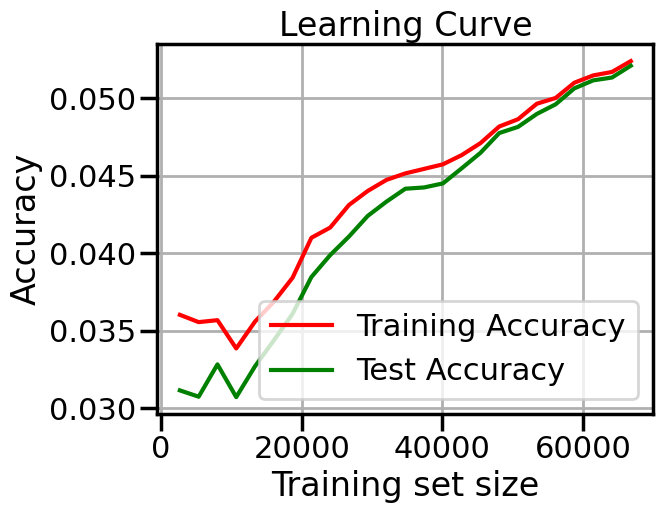

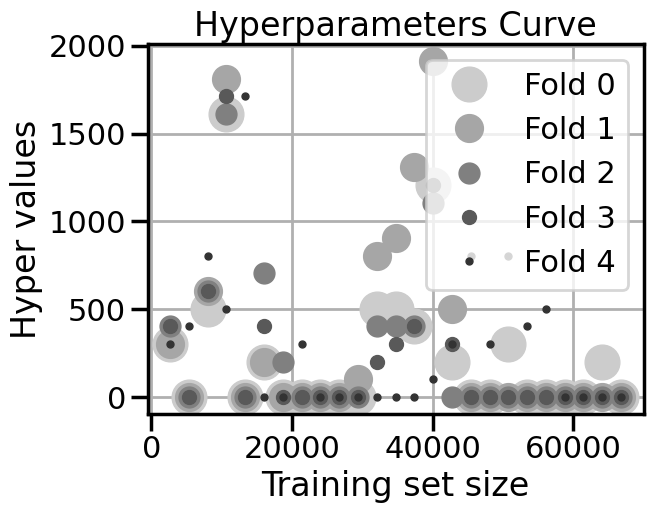


==========================Processing 0-th Fold==========================


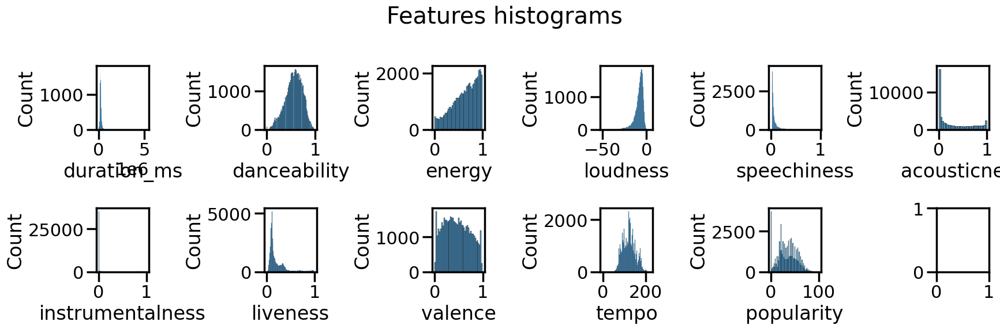

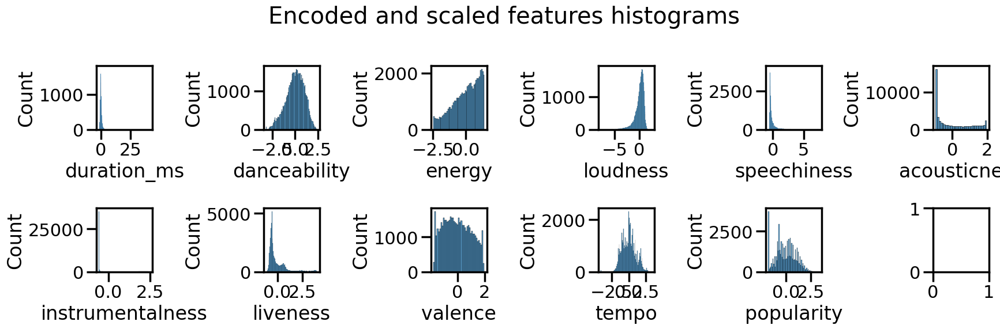


----------------------Validate  0-th Fold with regularization: 0.0 -------------------------

----------------------Validate  0-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  0-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  0-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  0-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  0-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  0-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  0-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  0-th Fold with regularization: 805.3691275167786 -------------------------

----------------------Validate  0-th Fold

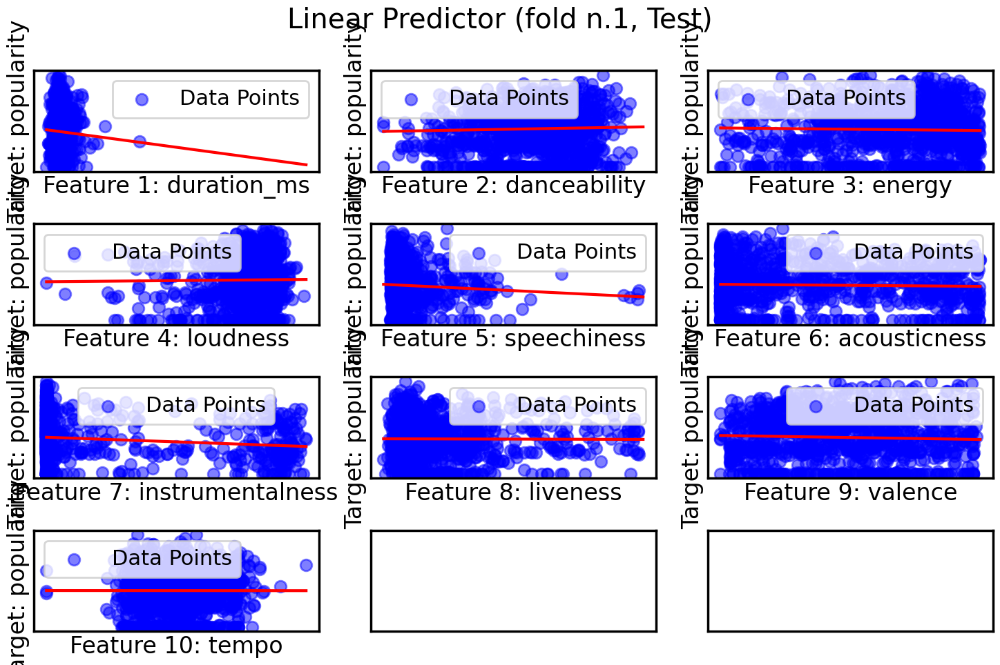


==========================Processing 1-th Fold==========================

----------------------Validate  1-th Fold with regularization: 0.0 -------------------------

----------------------Validate  1-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  1-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  1-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  1-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  1-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  1-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  1-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  1-th Fold with regularization: 805.36912751

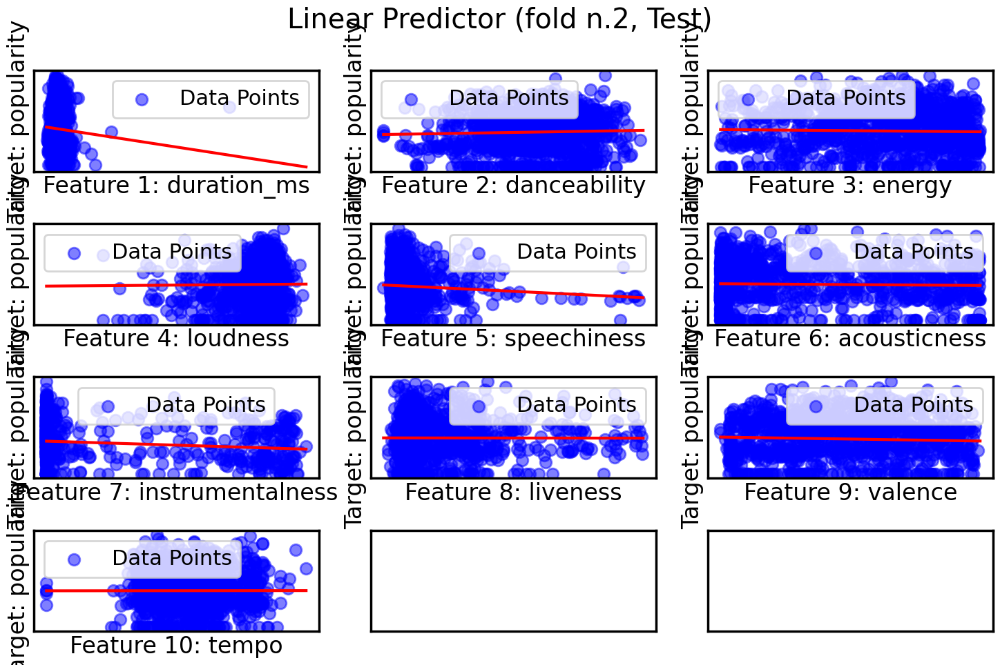


==========================Processing 2-th Fold==========================

----------------------Validate  2-th Fold with regularization: 0.0 -------------------------

----------------------Validate  2-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  2-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  2-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  2-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  2-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  2-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  2-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  2-th Fold with regularization: 805.36912751

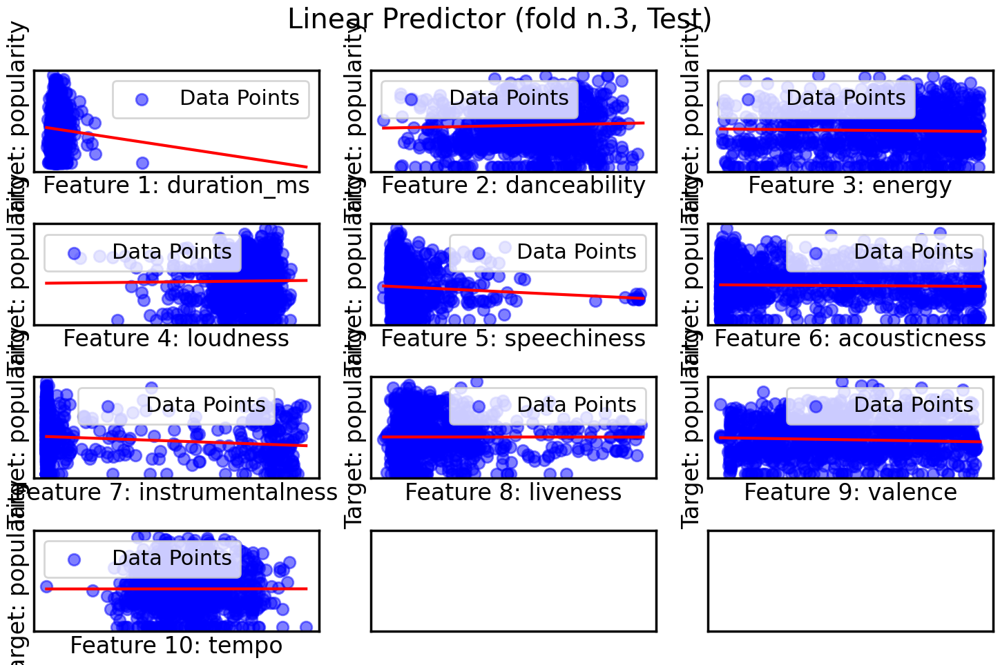


==========================Processing 3-th Fold==========================

----------------------Validate  3-th Fold with regularization: 0.0 -------------------------

----------------------Validate  3-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  3-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  3-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  3-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  3-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  3-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  3-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  3-th Fold with regularization: 805.36912751

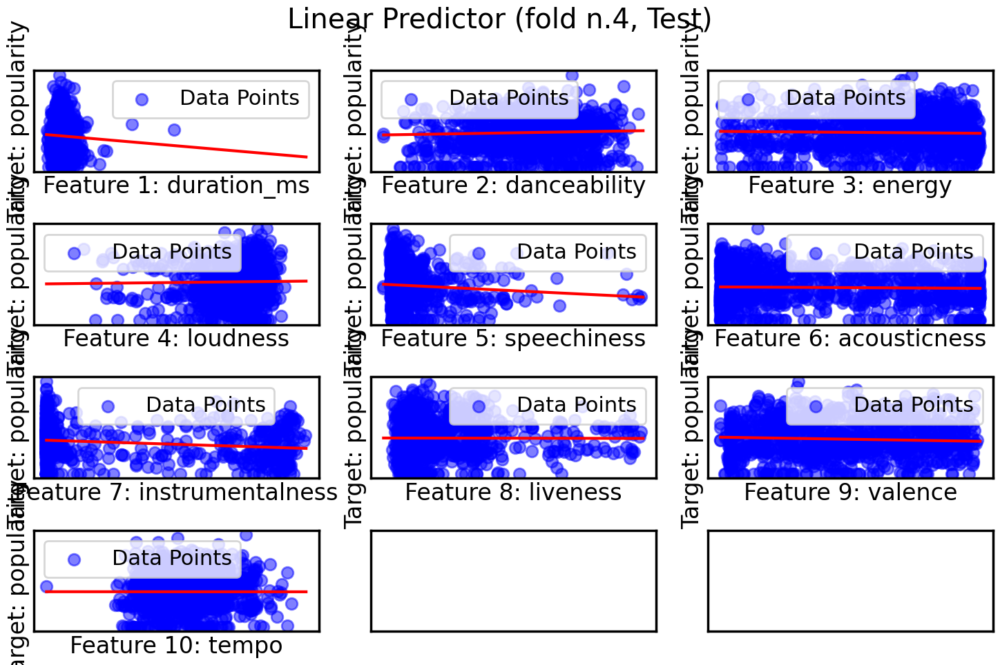


==========================Processing 4-th Fold==========================

----------------------Validate  4-th Fold with regularization: 0.0 -------------------------

----------------------Validate  4-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  4-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  4-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  4-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  4-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  4-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  4-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  4-th Fold with regularization: 805.36912751

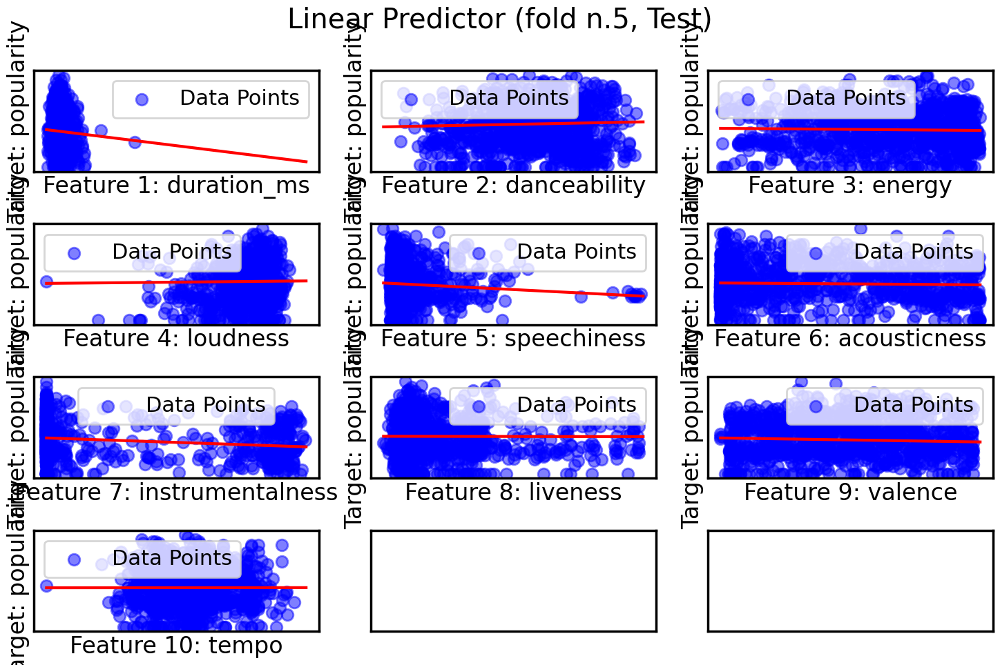

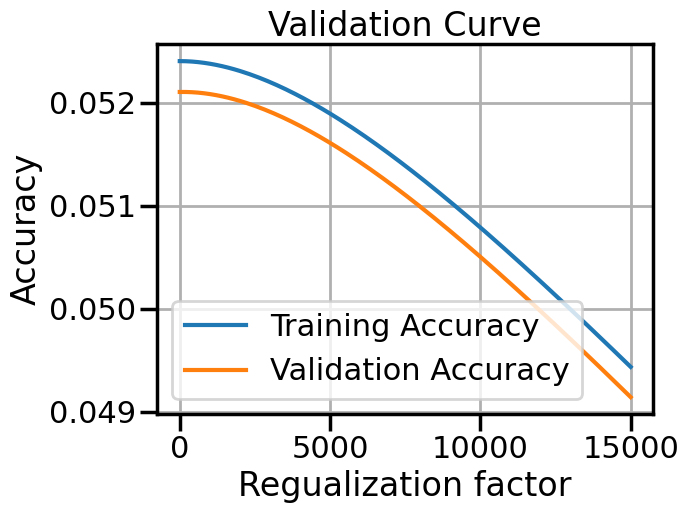

       Fold  Hyperparameter  Training_accuracy  Test_accuracy  \
0  Fold n.0             0.0           0.058069       0.032509   
1  Fold n.1             0.0           0.052153       0.050667   
2  Fold n.2             0.0           0.052359       0.051353   
3  Fold n.3             0.0           0.049899       0.062133   
4  Fold n.4             0.0           0.049535       0.063855   

   Exp. training acc. estimate  Accuracy estimate (Exp. stat. acc. estimate)  
0                     0.052403                                      0.052104  
1                     0.052403                                      0.052104  
2                     0.052403                                      0.052104  
3                     0.052403                                      0.052104  
4                     0.052403                                      0.052104  
       Fold           w_0       w_1       w_2       w_3       w_4       w_5  \
0  Fold n.0  7.574846e-17 -0.049339  0.097607 -0.085117 

In [25]:
K = 5
hyper_space = np.linspace(0, 15000, num=150)
samples = 25
type = 'nestedKFoldCV'

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence'): StandardScaler()
    # Aggiungi altre feature con le rispettive funzioni scaler
}

# Nested K-fold cross validation
tuning_validation = expectedRiskEstimate(K, RidgeRegression, scalers=scalers, features=features_continuous, target=target, \
                                 evaluation=r2_score, verbose=True, visualize=False)
tuning_validation.learningCurveCV(X, y, hyper_space, type, samples)
tuning_validation.set_visualize(True)
tuning_validation.nestedKFoldCV(X, y, hyper_space)
tuning_validation.save(save_path)
tuning_validation.save_predictors(save_path)
opt_alpha_no_scaling = tuning_validation.get_hyper_opt()

**MODEL COMPARISON**

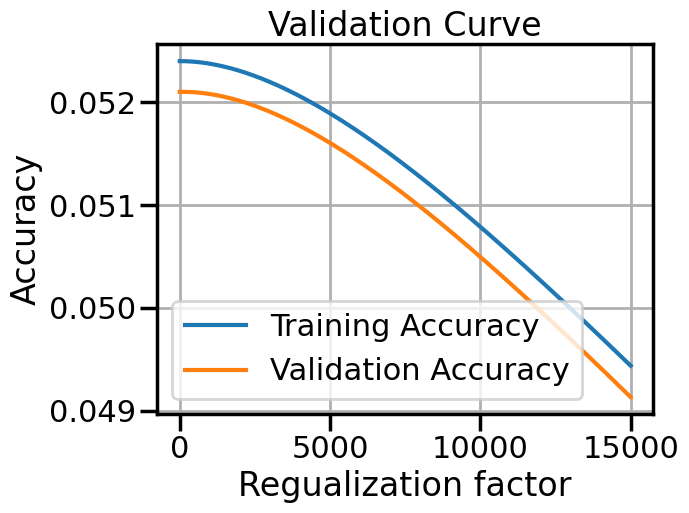

In [27]:
X_scaled = X
y_scaled = y
model = Ridge()

for features, scaler in scalers.items():
    feat = list(features)
    if target[0] in features:
        feat.remove(target[0])
    X_scaled[feat] = scaler.fit_transform(X_scaled[feat])
    if target[0] in features:
        y_scaled = scaler.fit_transform(y_scaled)

mse_scorer = make_scorer(r2_score)
scores = cross_val_score(model, X_scaled, y_scaled, cv=5, scoring=mse_scorer)
scores, scores.mean()

hyper_space = np.linspace(0, 15000, num=300)
train_scores_curve, test_scores_curve = validation_curve(model, X_scaled, y_scaled, param_name="alpha", param_range=hyper_space, cv=5, scoring=mse_scorer)

hyper_tuning_curve(hyper_space, train_scores_curve.T, test_scores_curve.T, method='Accuracy')

param_grid = {'alpha': hyper_space}
grid_search = GridSearchCV(model, param_grid, cv=5, scoring=mse_scorer)
grid_search.fit(X_scaled, y_scaled)
cv_results = grid_search.cv_results_
mean_test_scores = cv_results['mean_test_score']
results_df = pd.DataFrame(grid_search.cv_results_)
results_df.to_csv('./grid_serach_results.csv', index=False)
df_to_latex_table(results_df, './grid_serach_results.txt')

**TRAINING (Kernel ridge regression)**


==========================Create 0-th Fold==========================

==========================Create 1-th Fold==========================

==========================Create 2-th Fold==========================

==========================Create 3-th Fold==========================

==========================Create 4-th Fold==========================

==========================Pre-processing 0-th Fold==========================


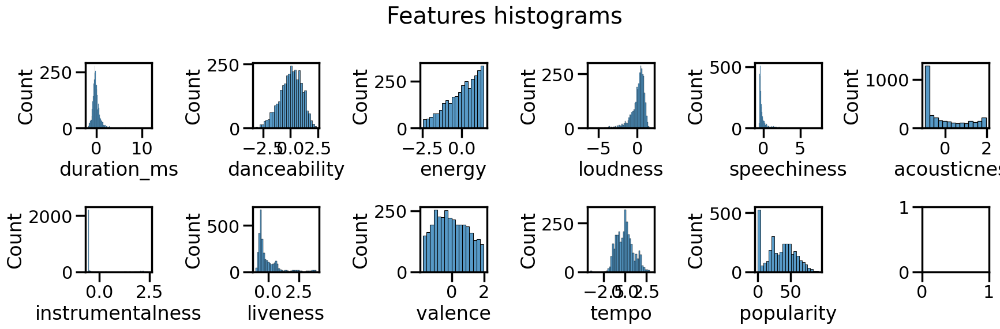

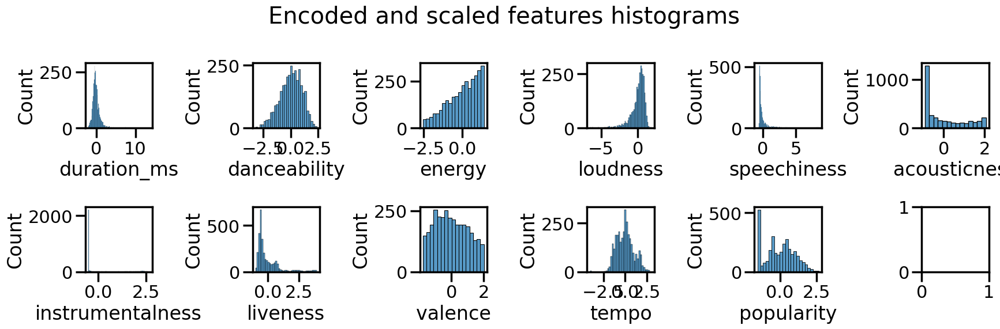

Output streaming troncato alle ultime 5000 righe.

----------------------Test  0-th Fold with regularization: [1.e-03 2.e+01] -------------------------

-------------------------------------Fitting Kernel Ridge Regression-------------------------

-------------------------------------Kernel matrix has been created--------------------------

-------------------------------------Inverse matrix has been computed------------------------

----------------------Test  1-th Fold with regularization: [1.e-03 2.e+01] -------------------------

-------------------------------------Fitting Kernel Ridge Regression-------------------------

-------------------------------------Kernel matrix has been created--------------------------

-------------------------------------Inverse matrix has been computed------------------------

----------------------Test  2-th Fold with regularization: [1.e-03 2.e+01] -------------------------

-------------------------------------Fitting Kernel Ridge Regression-----

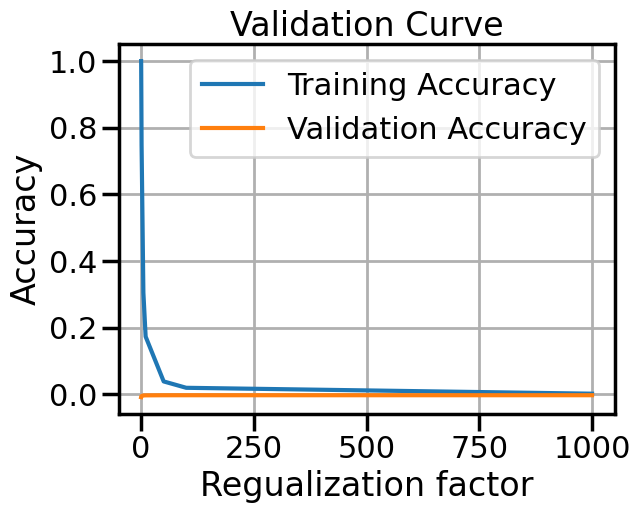

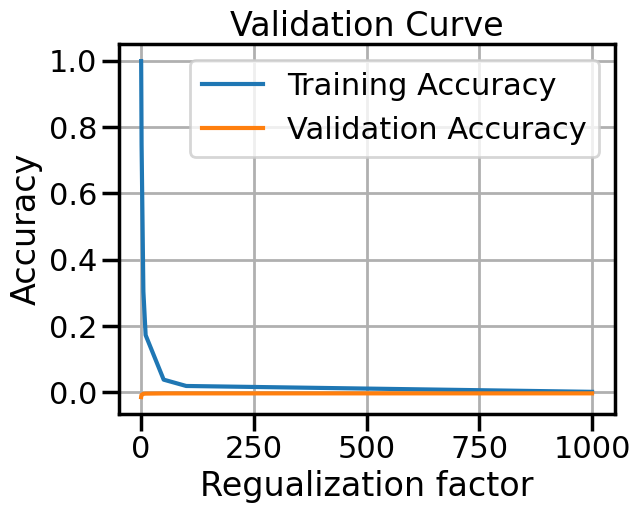

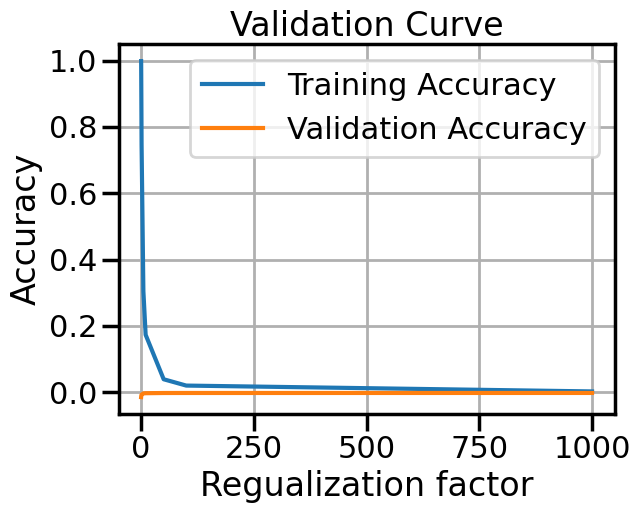

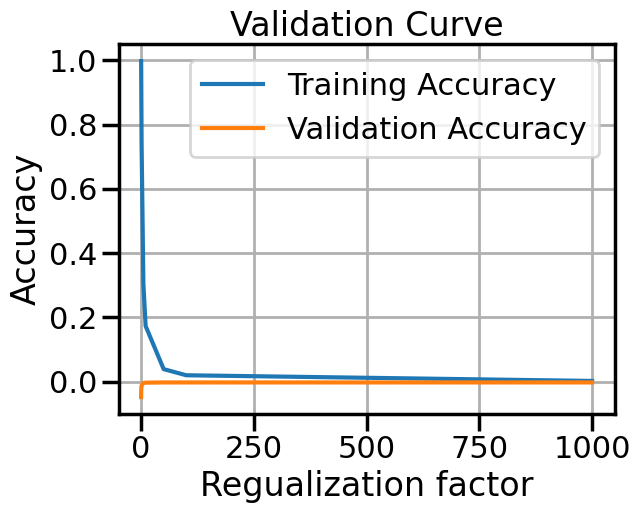

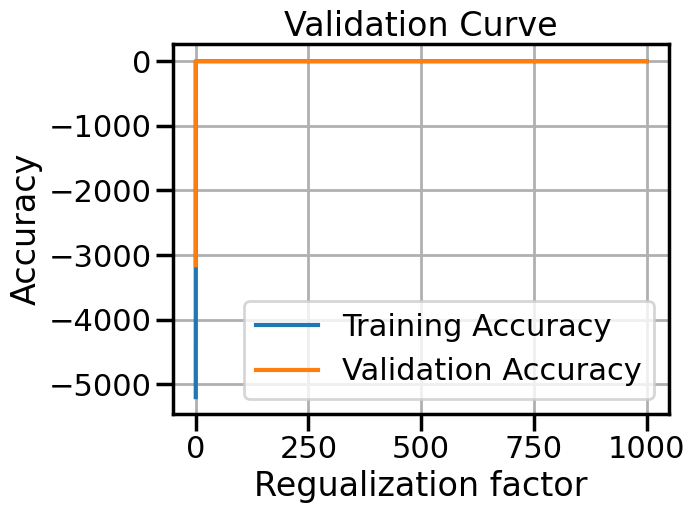

...

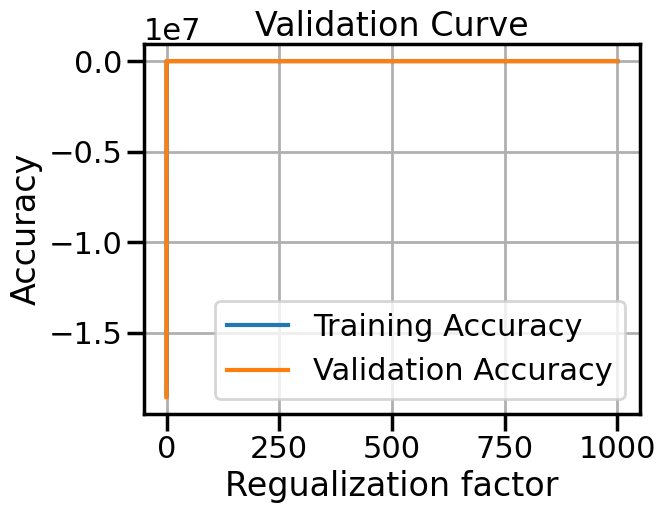

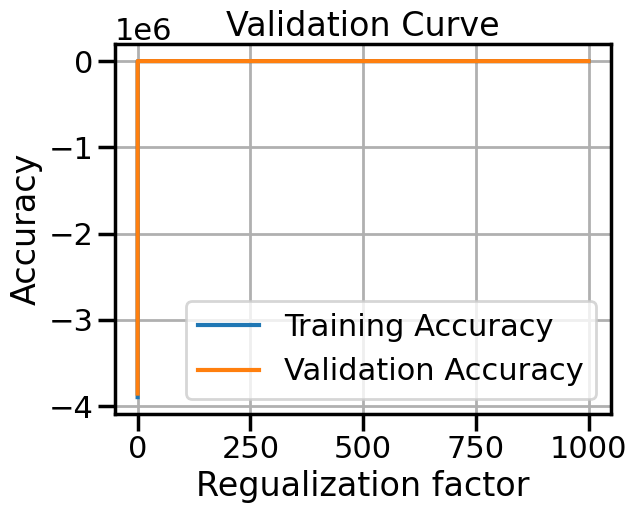

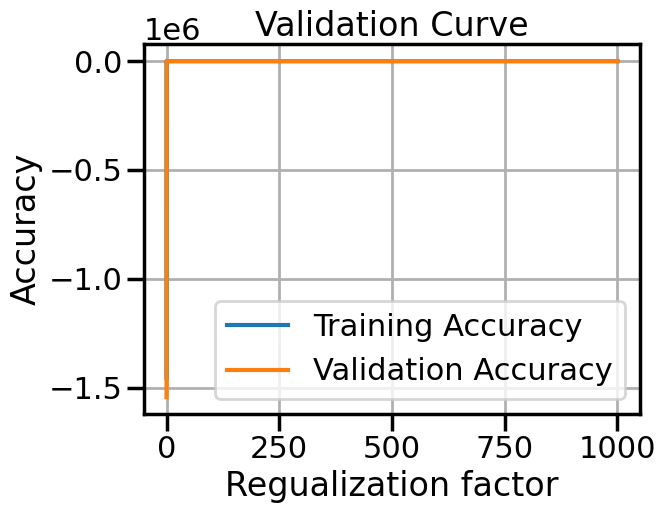

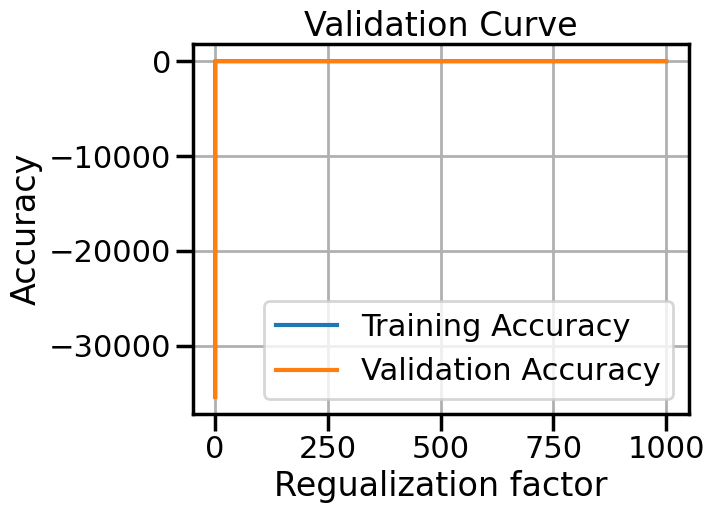

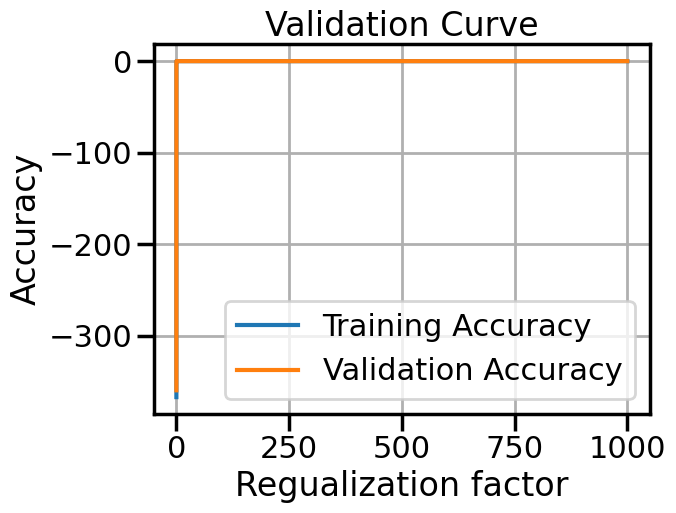

         Gamma   Alpha                                             Alphas  \
0      0.00001  1000.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
1      0.00100  1000.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
2      0.01000  1000.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
3      0.10000  1000.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
4      1.00000    10.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
5      2.00000    10.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
6      4.00000     5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
7      5.00000     5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
8     10.00000     5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
9     15.00000     1.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
10    20.00000     1.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
11    50.00000     0.5  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   

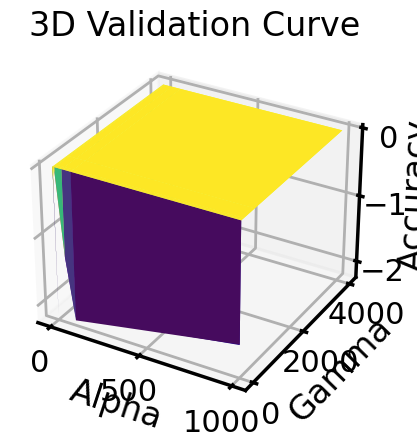

(0.08943867751961873,
 0.05564440362558494,
 array([ 1., 20.]),
 [array([ 0.29119589,  0.12718614, -1.57988725, ...,  0.55572022,
          0.63006011,  1.02347631]),
  array([ 0.60128257, -0.16589797, -1.0104814 , ...,  0.5585673 ,
          0.55711783,  0.97257545]),
  array([ 0.60048265, -0.25576407, -1.0843932 , ...,  0.59610003,
          0.64508413,  1.01534779]),
  array([ 0.48899625, -0.23614546, -1.06605132, ...,  0.6348944 ,
          0.59564992,  0.96380391]),
  array([ 0.62538108, -0.20537763, -0.96355987, ..., -0.46481583,
          0.01881315,  1.23053283])],
 3200)

In [30]:
K = 5
alphas = np.array([0.001, 0.1, 0.5, 1,  5, 10, 50, 100, 1000])
gammas = np.array([0.00001, 0.001, 0.01, 0.1, 1, 2, 4, 5, 10, 15, 20, 50, 100, 500, 4000])
hyper_space = np.array(list(product(alphas, gammas)))

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence'): StandardScaler()
}

X_red=X[:4000]
y_red=y[:4000]

features = features_continuous
best_cv = expectedRiskEstimate(K, KernelRidgeRegression, scalers=scalers, features=features, \
                        target=target, evaluation=r2_score, dc_applied=False, verbose=True, visualize=True)
best_cv.bestCV(X_red, y_red, hyper_space)

# **Kernel DC (Continuous)**


==========================Create 0-th Fold==========================

==========================Create 1-th Fold==========================

==========================Create 2-th Fold==========================

==========================Create 3-th Fold==========================

==========================Create 4-th Fold==========================

==========================Pre-processing 0-th Fold==========================


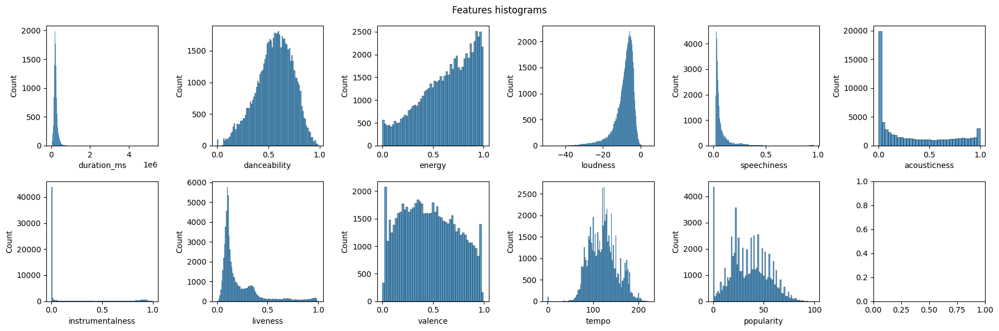

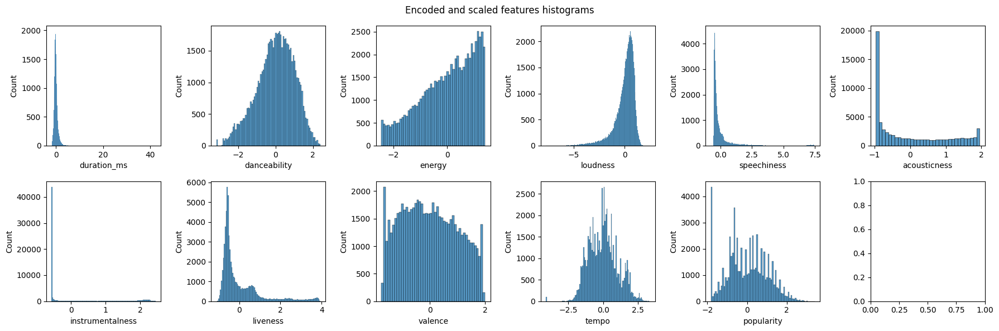

Output streaming troncato alle ultime 5000 righe.

--------------------------Score for submodel n. 15------------------------

--------------------------Score for submodel n. 16------------------------

--------------------------Score for submodel n. 17------------------------

--------------------------Score for submodel n. 18------------------------

--------------------------Score for submodel n. 19------------------------

=============================Score for Prediction n. 16577==========================

--------------------------Score for submodel n. 0------------------------

--------------------------Score for submodel n. 1------------------------

--------------------------Score for submodel n. 2------------------------

--------------------------Score for submodel n. 3------------------------

--------------------------Score for submodel n. 4------------------------

--------------------------Score for submodel n. 5------------------------

--------------------------Score f

In [15]:
save_path = './Results/Kernel/Continuous'

K = 5
hyper_space = np.array([[5, 10], [1, 20]])

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence'): StandardScaler()
}

X_red=X[:83475]
y_red=y[:83475]

sample_tollerance = 3200
features = features_continuous
best_cv = expectedRiskEstimate(K, DCKRR, scalers=scalers, features=features, \
                        target=target, evaluation=r2_score, sample_tollerance=sample_tollerance, \
                        dc_applied=True, verbose=True, visualize=True)
best_cv.bestCV(X_red, y_red, hyper_space)
best_cv.save_best(save_path)
best_cv.save_predictors(save_path)

# **Main execution (Categorical)**

In [8]:
# Read the data through pandas 'read_cvs'
df = pd.read_csv('./dataset.csv')
# Drop the 'Unnamed: 0' and the 'track_id' columns
df = df.drop(columns=df.columns[0:2])
# Print the header of the dataset
df.head()
# Print a description of the dataset
df.describe()
# Print the list of the attributes (plus the target)
list(df.columns)

features_continuous = ['duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', \
                       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
features_categorical = ['key', 'time_signature', 'track_genre', 'album_name', 'track_name']
features_binary = ['explicit', 'mode']
features_multi_values = ['artists']
target = ['popularity']

count_missing_key = (df['key'] == -1).sum()
if df.isna().sum().any():
    print(df[df.isna().any(axis=1)])
    df = df.dropna()

# Handle multivalued features: add a different row for each artist in a featuring
df[features_multi_values] = df[features_multi_values].apply(lambda x: x.str.split(';'))
df = df.explode(features_multi_values)

# Handle the $ character for the artist 'Bad$$'
df[features_multi_values] = df[features_multi_values].apply(lambda x: x.str.replace('\$\$','\\$\\$'))

# Encode the 'explicit' feature as 0-1 instead as False-True
df["explicit"] = df["explicit"].astype(int)

# Random shuffling of the dataset
df_encoded = df.sample(frac=1, random_state=42)

total_features=features_continuous+features_categorical+features_multi_values+features_binary
Xy = df_encoded[total_features+target]
print('Number of non-duplicated examples: '+str(Xy[~Xy.duplicated()==1].shape[0]))
print('Number of non-duplicated datapoints: '+str(Xy[total_features][~Xy[total_features].duplicated()==1].shape[0]))

Xy = Xy[~Xy[total_features].duplicated()==1]

X = Xy[total_features]
y = Xy[target]

save_path = './Results/Categorical_alt'

      artists album_name track_name  popularity  duration_ms  explicit  \
65900     NaN        NaN        NaN           0            0     False   

       danceability  energy  key  loudness  mode  speechiness  acousticness  \
65900         0.501   0.583    7     -9.46     0       0.0605          0.69   

       instrumentalness  liveness  valence    tempo  time_signature  \
65900           0.00396    0.0747    0.734  138.391               4   

      track_genre  
65900       k-pop  
Number of non-duplicated examples: 157380
Number of non-duplicated datapoints: 157193


**TRAINING (ridge regression)**:

1.   **target encoding** for 'track\_genre', **count encoding** for 'artists', 'album\_name', 'track\_name'.
2.   **one-hot encoding** for 'track\_genre', **count encoding** for 'artists', 'album\_name', 'track\_name'.
3.  **one-hot encoding** for 'track\_genre', **hash encoding** for 'artists', 'album\_name', 'track\_name'.



Output streaming troncato alle ultime 5000 righe.

----------------------Validate  3-th Fold with regularization: 8657.71812080537 -------------------------

----------------------Validate  3-th Fold with regularization: 8758.389261744967 -------------------------

----------------------Validate  3-th Fold with regularization: 8859.060402684565 -------------------------

----------------------Validate  3-th Fold with regularization: 8959.731543624162 -------------------------

----------------------Validate  3-th Fold with regularization: 9060.402684563758 -------------------------

----------------------Validate  3-th Fold with regularization: 9161.073825503356 -------------------------

----------------------Validate  3-th Fold with regularization: 9261.744966442953 -------------------------

----------------------Validate  3-th Fold with regularization: 9362.41610738255 -------------------------

----------------------Validate  3-th Fold with regularization: 9463.087248322148 ------

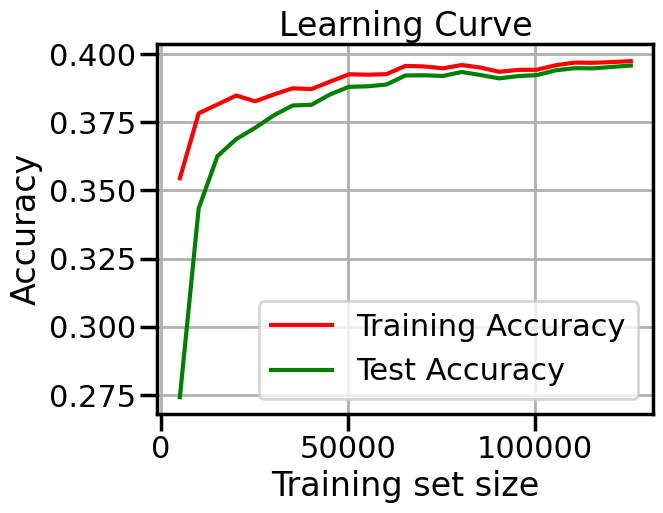

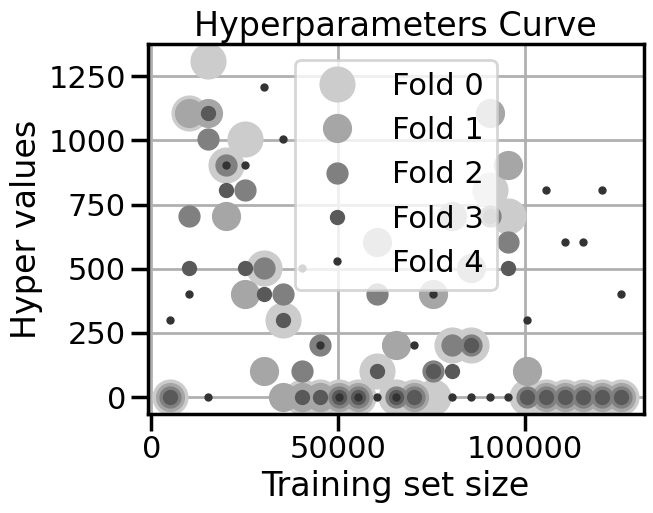


==========================Processing 0-th Fold==========================


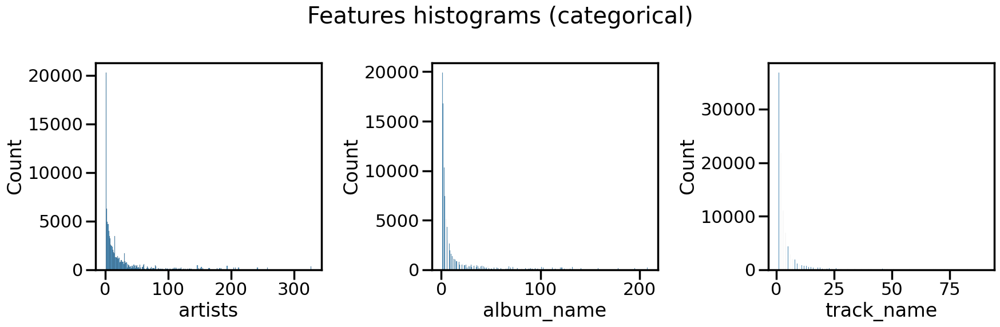

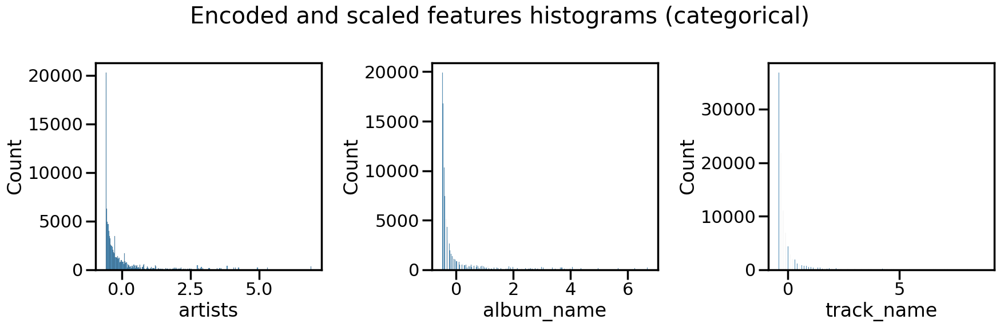


----------------------Validate  0-th Fold with regularization: 0.0 -------------------------

----------------------Validate  0-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  0-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  0-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  0-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  0-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  0-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  0-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  0-th Fold with regularization: 805.3691275167786 -------------------------

----------------------Validate  0-th Fold

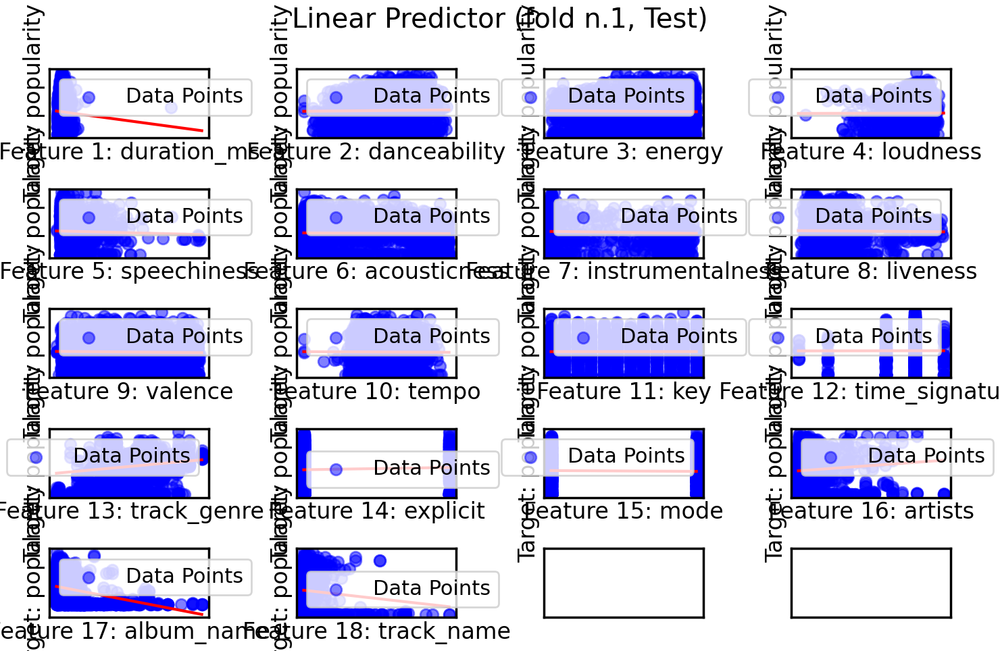


==========================Processing 1-th Fold==========================

----------------------Validate  1-th Fold with regularization: 0.0 -------------------------

----------------------Validate  1-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  1-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  1-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  1-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  1-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  1-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  1-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  1-th Fold with regularization: 805.36912751

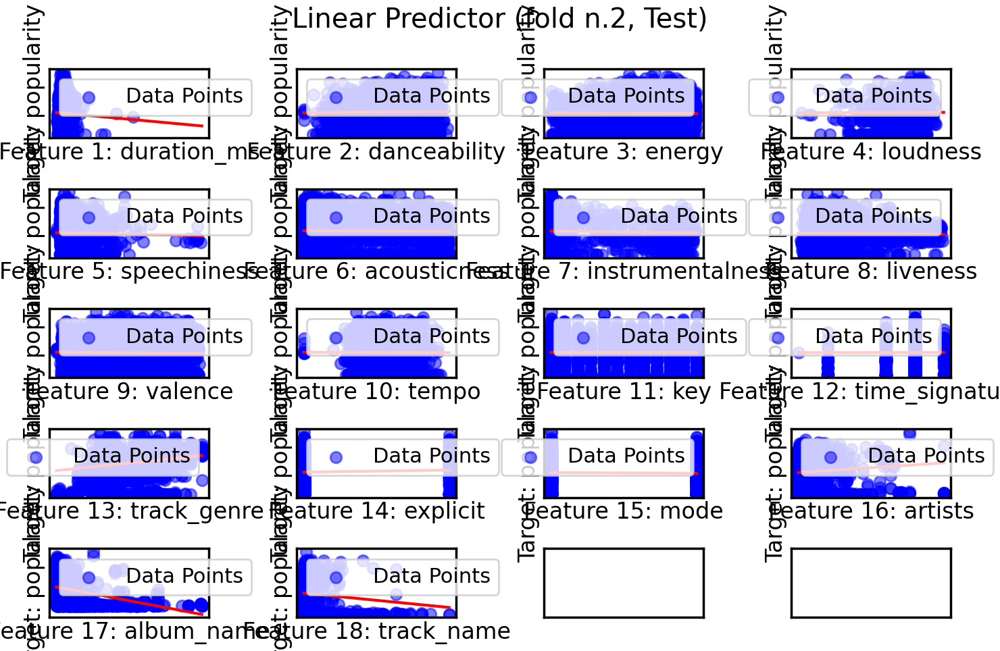


==========================Processing 2-th Fold==========================

----------------------Validate  2-th Fold with regularization: 0.0 -------------------------

----------------------Validate  2-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  2-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  2-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  2-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  2-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  2-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  2-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  2-th Fold with regularization: 805.36912751

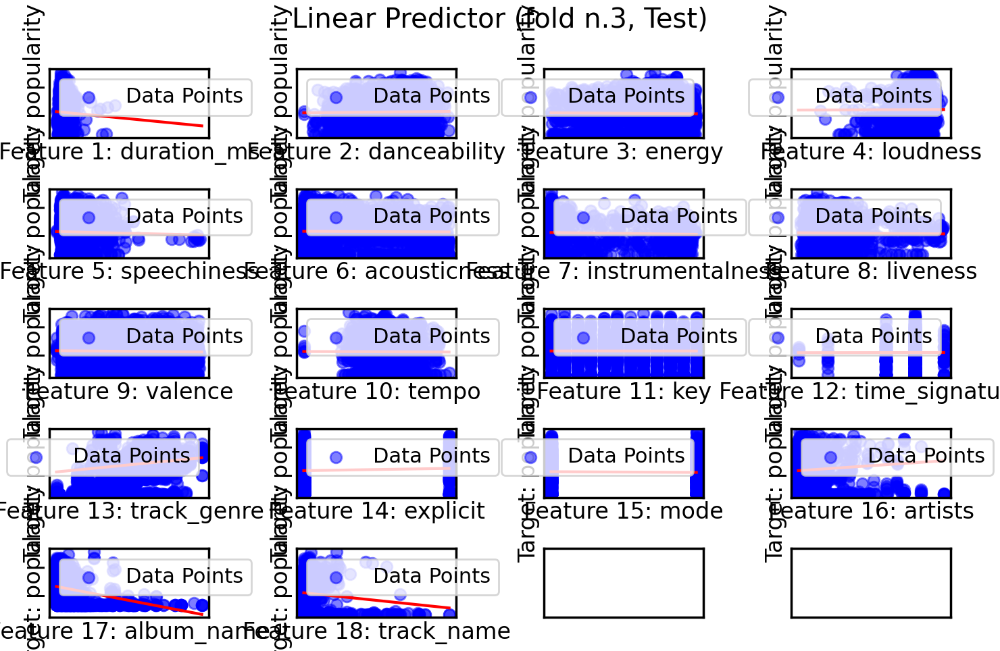


==========================Processing 3-th Fold==========================

----------------------Validate  3-th Fold with regularization: 0.0 -------------------------

----------------------Validate  3-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  3-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  3-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  3-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  3-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  3-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  3-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  3-th Fold with regularization: 805.36912751

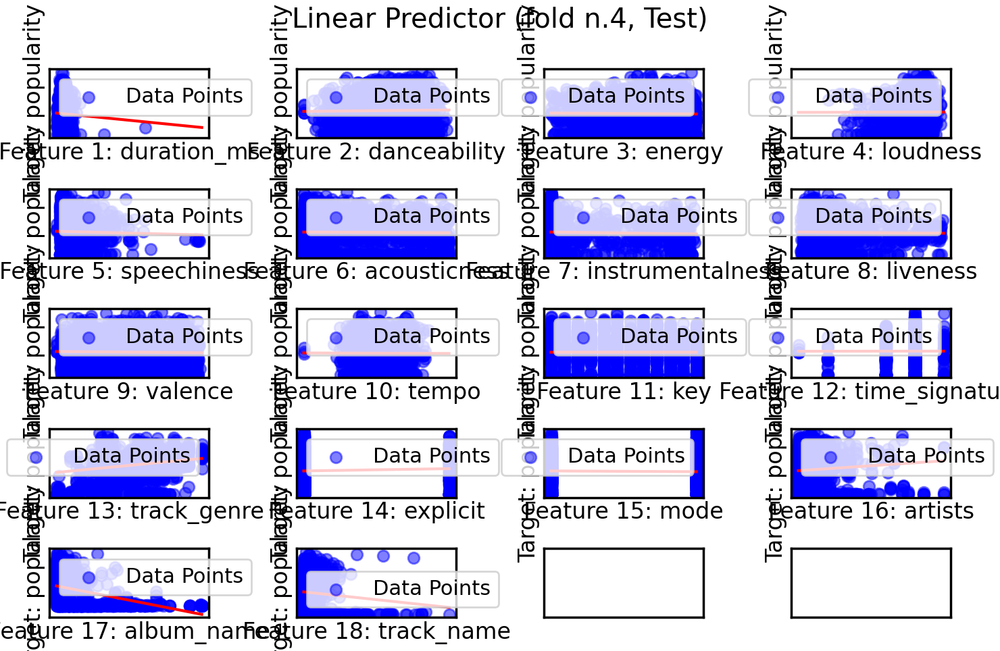


==========================Processing 4-th Fold==========================

----------------------Validate  4-th Fold with regularization: 0.0 -------------------------

----------------------Validate  4-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  4-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  4-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  4-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  4-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  4-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  4-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  4-th Fold with regularization: 805.36912751

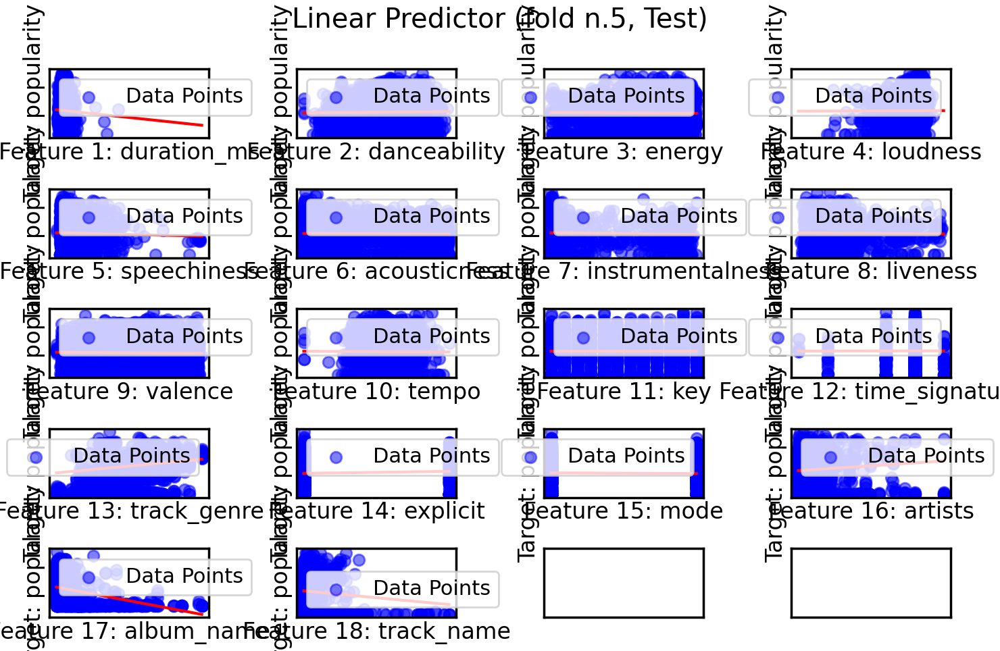

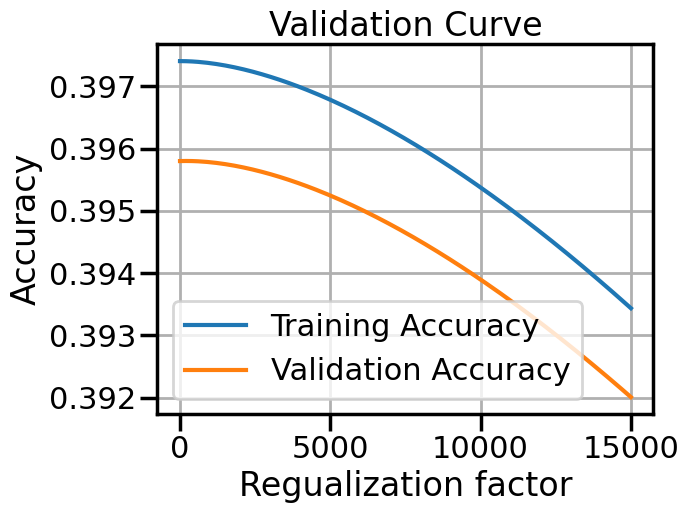

       Fold  Hyperparameter  Training_accuracy  Test_accuracy  \
0  Fold n.0        0.000000           0.399457       0.393754   
1  Fold n.1        0.000000           0.396725       0.397675   
2  Fold n.2        0.000000           0.397175       0.396536   
3  Fold n.3        0.000000           0.399001       0.394533   
4  Fold n.4      402.684564           0.394665       0.396447   

   Exp. training acc. estimate  Accuracy estimate (Exp. stat. acc. estimate)  
0                     0.397405                                      0.395789  
1                     0.397405                                      0.395789  
2                     0.397405                                      0.395789  
3                     0.397405                                      0.395789  
4                     0.397405                                      0.395789  
       Fold       w_0       w_1       w_2       w_3       w_4       w_5  \
0  Fold n.0  0.018310 -0.026376  0.037634 -0.042487  0.01163

In [11]:
K = 5
hyper_space = np.linspace(0, 15000, num=150)
samples = 25
type = 'nestedKFoldCV'

encoders = {
    ('track_genre'): TargetEncoding(target_col=target, encoding_type='mean', smoothing=5, default_shrink=3),
    ('artists', 'album_name', 'track_name'): ce.CountEncoder()
}

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence', \
     'artists', 'time_signature', 'key', 'track_genre', 'album_name', 'track_name'): StandardScaler()
    # Aggiungi altre feature con le rispettive funzioni scaler
}

features = features_continuous+features_categorical+features_multi_values+features_binary
tuning_validation = expectedRiskEstimate(K, RidgeRegression, scalers=scalers, encoders=encoders, features=features, \
                       target=target, evaluation=r2_score, verbose=True, visualize=False)
tuning_validation.learningCurveCV(X, y, hyper_space, type, samples)
tuning_validation.set_visualize(True)
tuning_validation.nestedKFoldCV(X, y, hyper_space)
tuning_validation.save(save_path)
tuning_validation.save_predictors(save_path)
optimal_alpha = tuning_validation.get_hyper_opt()

Output streaming troncato alle ultime 5000 righe.

----------------------Validate  3-th Fold with regularization: 8657.71812080537 -------------------------

----------------------Validate  3-th Fold with regularization: 8758.389261744967 -------------------------

----------------------Validate  3-th Fold with regularization: 8859.060402684565 -------------------------

----------------------Validate  3-th Fold with regularization: 8959.731543624162 -------------------------

----------------------Validate  3-th Fold with regularization: 9060.402684563758 -------------------------

----------------------Validate  3-th Fold with regularization: 9161.073825503356 -------------------------

----------------------Validate  3-th Fold with regularization: 9261.744966442953 -------------------------

----------------------Validate  3-th Fold with regularization: 9362.41610738255 -------------------------

----------------------Validate  3-th Fold with regularization: 9463.087248322148 ------

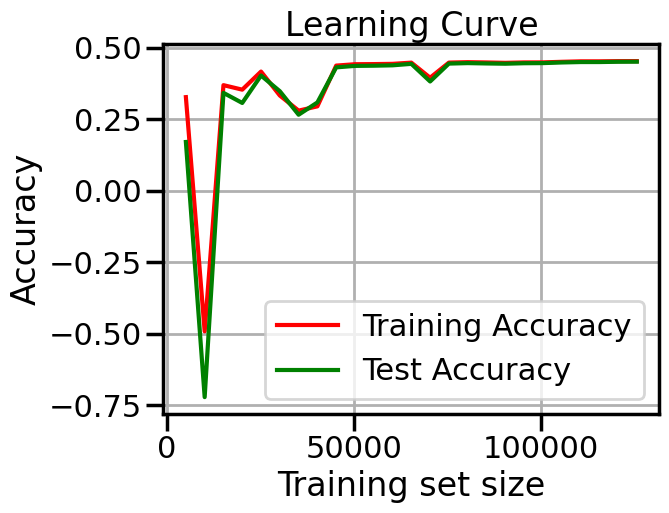

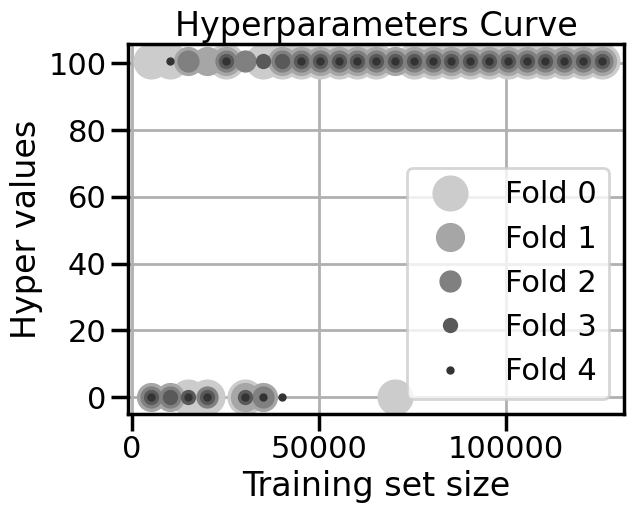


==========================Processing 0-th Fold==========================


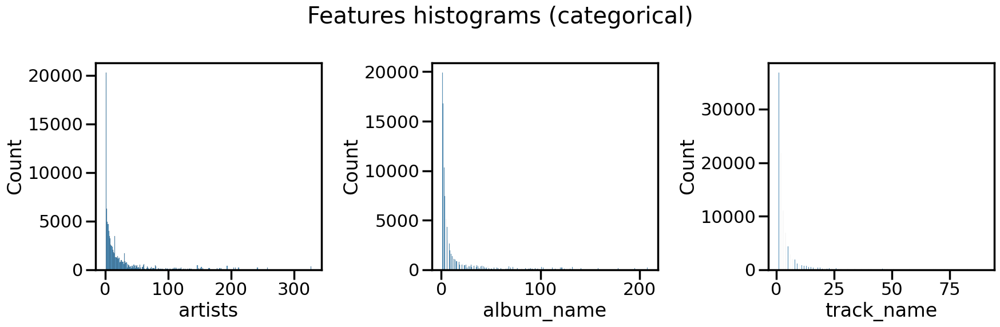

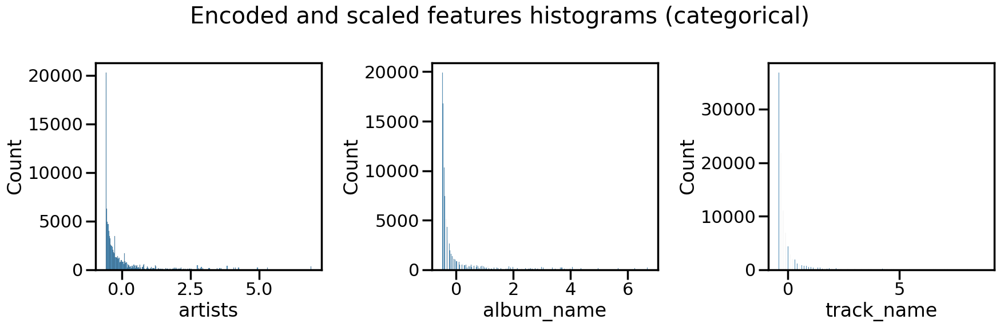


----------------------Validate  0-th Fold with regularization: 0.0 -------------------------

----------------------Validate  0-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  0-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  0-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  0-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  0-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  0-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  0-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  0-th Fold with regularization: 805.3691275167786 -------------------------

----------------------Validate  0-th Fold

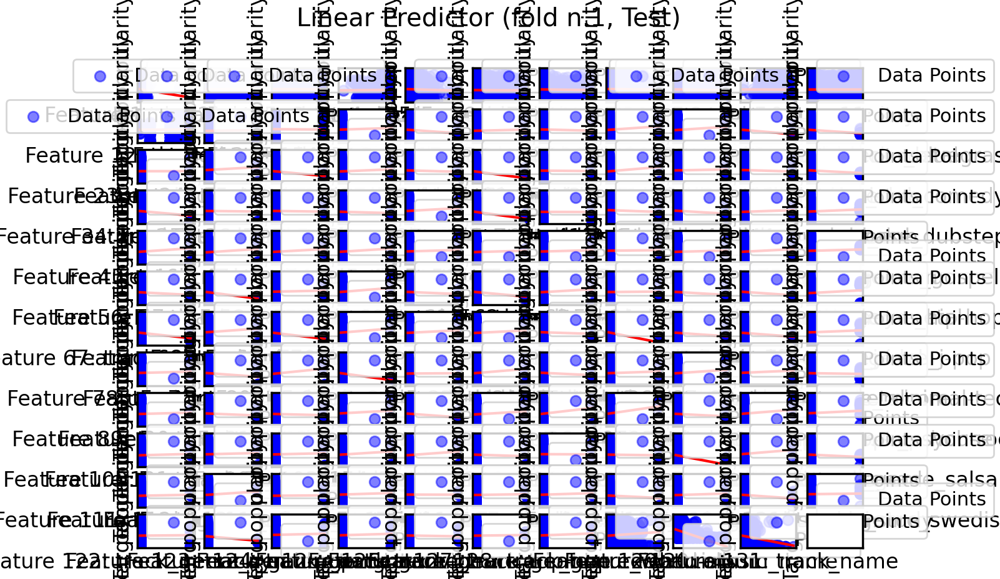


==========================Processing 1-th Fold==========================

----------------------Validate  1-th Fold with regularization: 0.0 -------------------------

----------------------Validate  1-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  1-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  1-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  1-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  1-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  1-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  1-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  1-th Fold with regularization: 805.36912751

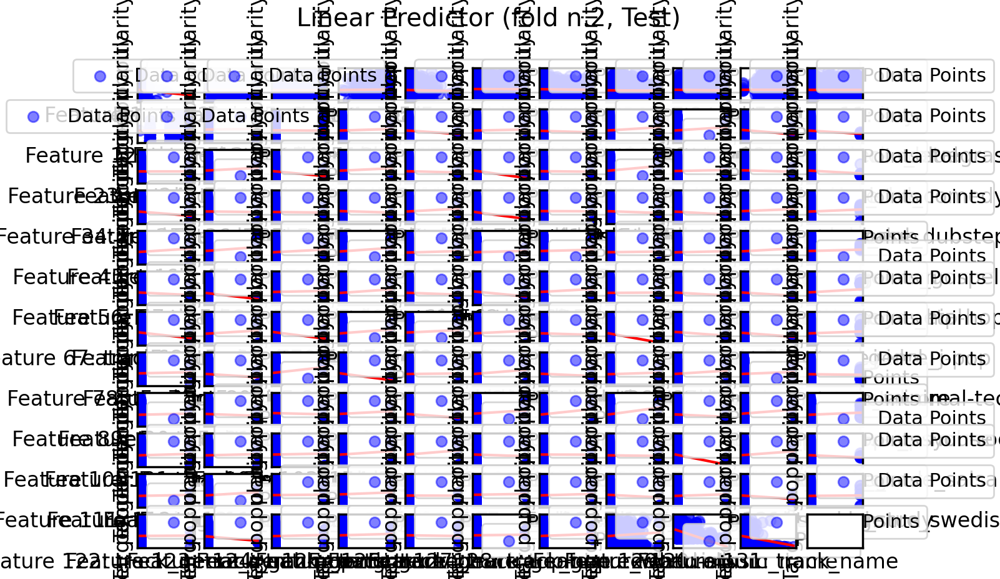


==========================Processing 2-th Fold==========================

----------------------Validate  2-th Fold with regularization: 0.0 -------------------------

----------------------Validate  2-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  2-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  2-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  2-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  2-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  2-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  2-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  2-th Fold with regularization: 805.36912751

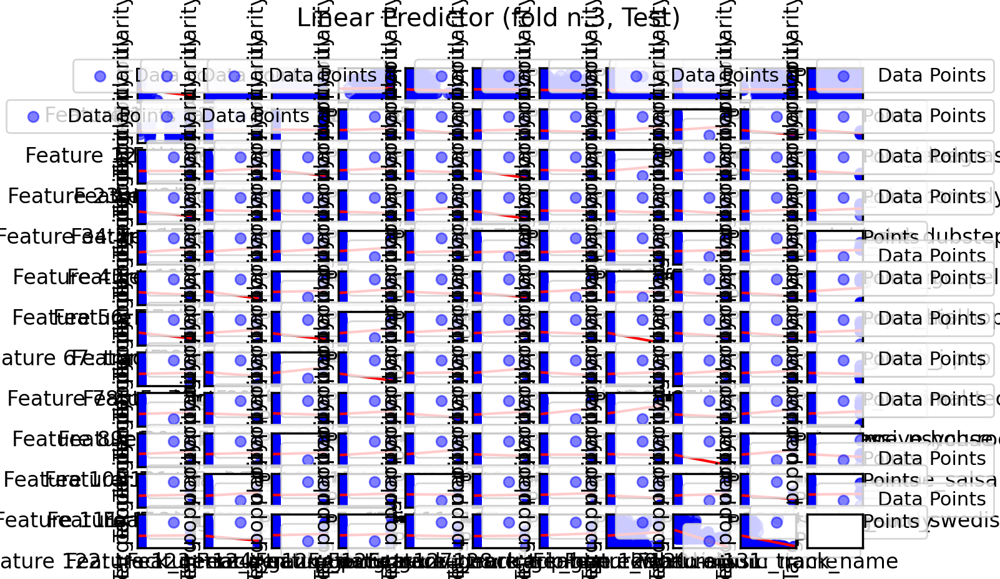


==========================Processing 3-th Fold==========================

----------------------Validate  3-th Fold with regularization: 0.0 -------------------------

----------------------Validate  3-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  3-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  3-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  3-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  3-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  3-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  3-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  3-th Fold with regularization: 805.36912751

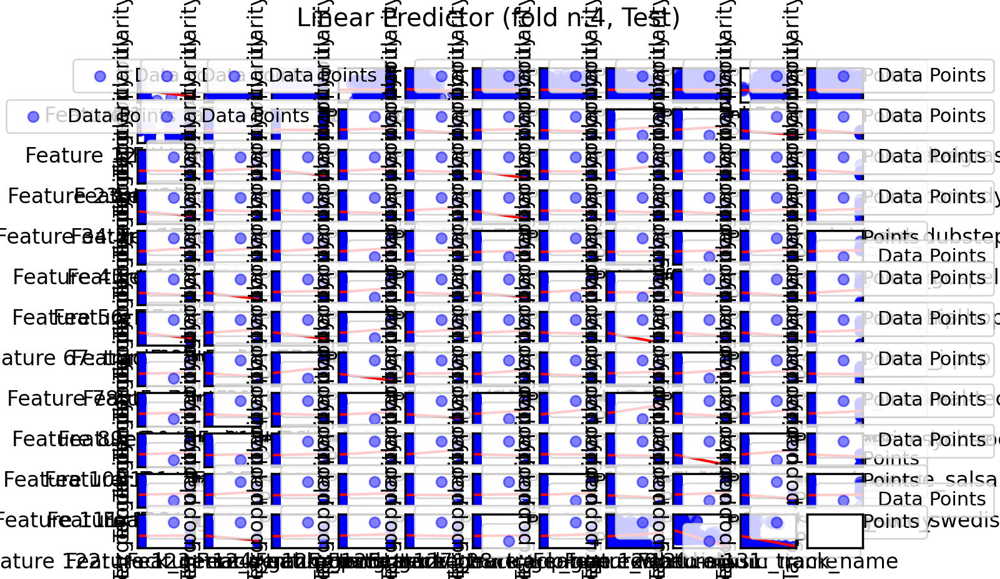


==========================Processing 4-th Fold==========================

----------------------Validate  4-th Fold with regularization: 0.0 -------------------------

----------------------Validate  4-th Fold with regularization: 100.67114093959732 -------------------------

----------------------Validate  4-th Fold with regularization: 201.34228187919464 -------------------------

----------------------Validate  4-th Fold with regularization: 302.013422818792 -------------------------

----------------------Validate  4-th Fold with regularization: 402.6845637583893 -------------------------

----------------------Validate  4-th Fold with regularization: 503.3557046979866 -------------------------

----------------------Validate  4-th Fold with regularization: 604.026845637584 -------------------------

----------------------Validate  4-th Fold with regularization: 704.6979865771813 -------------------------

----------------------Validate  4-th Fold with regularization: 805.36912751

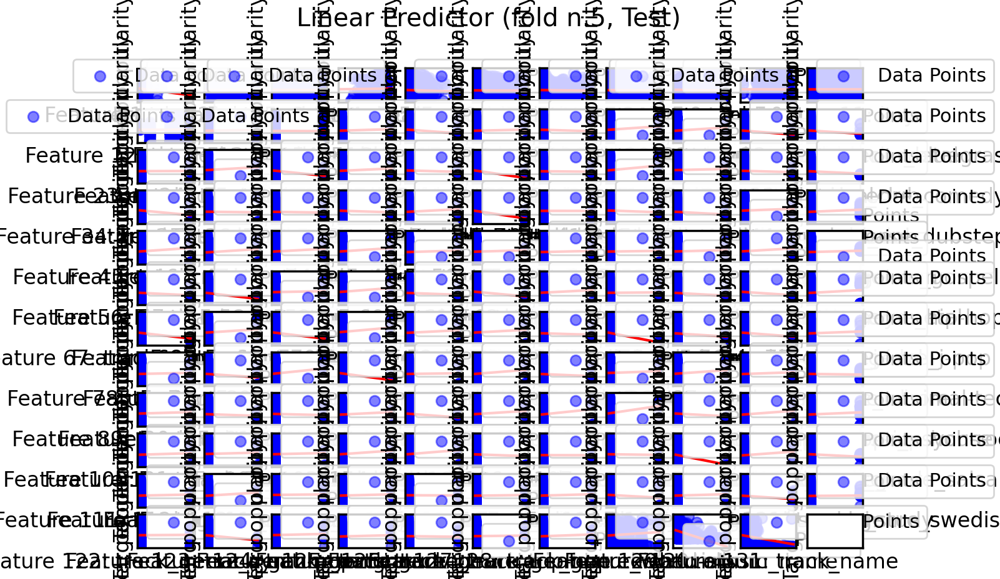

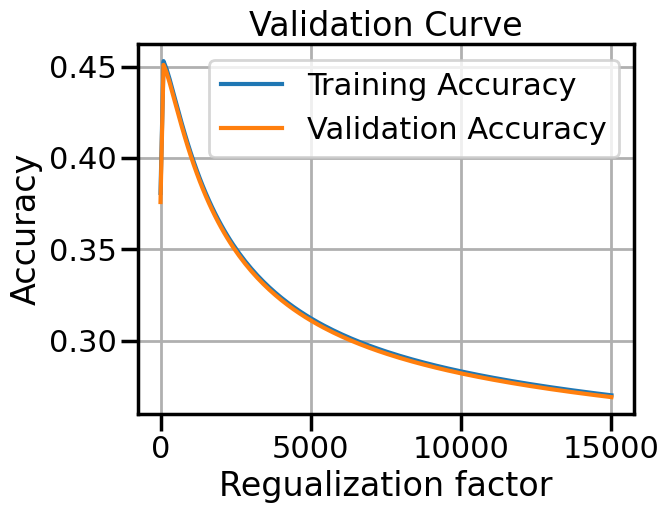

       Fold  Hyperparameter  Training_accuracy  Test_accuracy  \
0  Fold n.0      100.671141           0.453248       0.447921   
1  Fold n.1      100.671141           0.452226       0.452826   
2  Fold n.2      100.671141           0.453398       0.452717   
3  Fold n.3      100.671141           0.455539       0.449489   
4  Fold n.4      100.671141           0.450384       0.451672   

   Exp. training acc. estimate  Accuracy estimate (Exp. stat. acc. estimate)  
0                     0.452959                                      0.450925  
1                     0.452959                                      0.450925  
2                     0.452959                                      0.450925  
3                     0.452959                                      0.450925  
4                     0.452959                                      0.450925  
       Fold       w_0       w_1       w_2       w_3       w_4       w_5  \
0  Fold n.0 -0.017314 -0.022938  0.030895 -0.034278  0.02996

In [10]:
K = 5
hyper_space = np.linspace(0, 15000, num=150)
samples = 25
type = 'nestedKFoldCV'

encoders = {
    ('track_genre'): OneHotEncoder(sparse_output=False),
    ('artists', 'album_name', 'track_name'): ce.CountEncoder()
}

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence', \
     'artists', 'time_signature', 'key', 'album_name', 'track_name'): StandardScaler()
}

features = features_continuous+features_categorical+features_multi_values+features_binary
tuning_validation = expectedRiskEstimate(K, RidgeRegression, scalers=scalers, encoders=encoders, features=features, \
                       target=target, evaluation=r2_score, verbose=True, visualize=False)
tuning_validation.learningCurveCV(X, y, hyper_space, type, samples)
tuning_validation.set_visualize(True)
tuning_validation.nestedKFoldCV(X, y, hyper_space)
tuning_validation.save(save_path)
tuning_validation.save_predictors(save_path)
optimal_alpha = tuning_validation.get_hyper_opt()

Output streaming troncato alle ultime 5000 righe.

----------------------Validate  3-th Fold with regularization: 8657.72234899329 -------------------------

----------------------Validate  3-th Fold with regularization: 8758.393422818792 -------------------------

----------------------Validate  3-th Fold with regularization: 8859.064496644296 -------------------------

----------------------Validate  3-th Fold with regularization: 8959.735570469798 -------------------------

----------------------Validate  3-th Fold with regularization: 9060.406644295303 -------------------------

----------------------Validate  3-th Fold with regularization: 9161.077718120805 -------------------------

----------------------Validate  3-th Fold with regularization: 9261.74879194631 -------------------------

----------------------Validate  3-th Fold with regularization: 9362.419865771812 -------------------------

----------------------Validate  3-th Fold with regularization: 9463.090939597316 ------

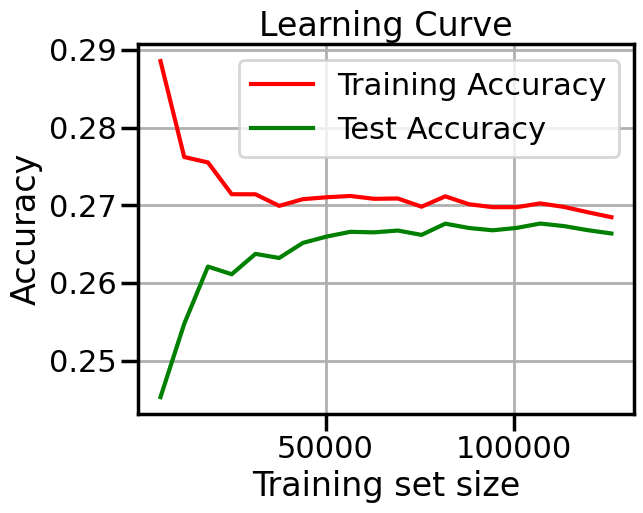

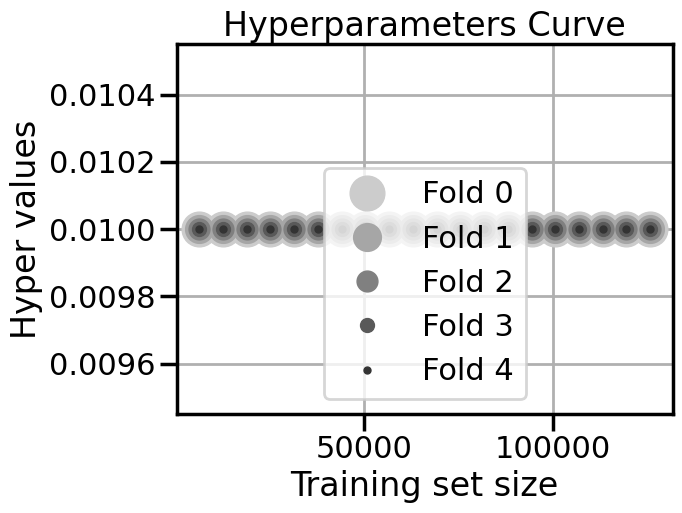


==========================Processing 0-th Fold==========================


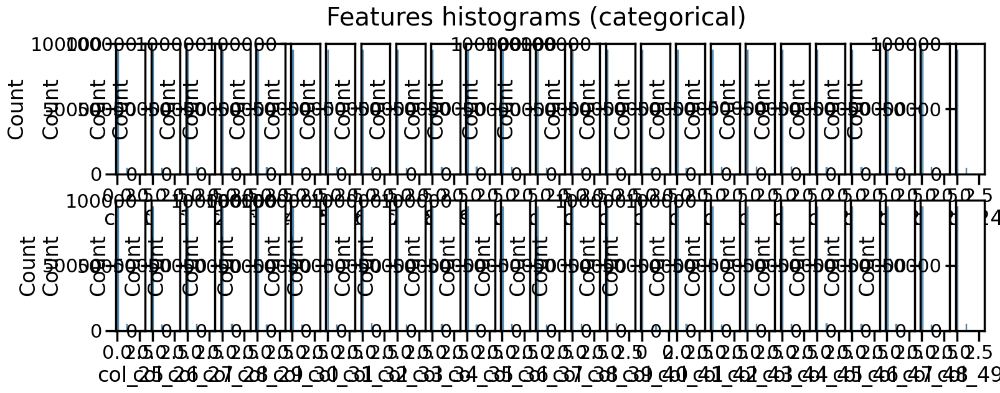

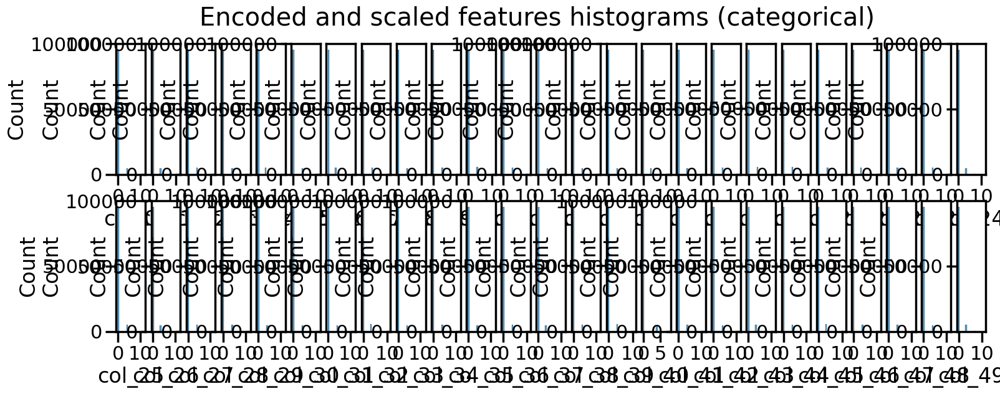


----------------------Validate  0-th Fold with regularization: 0.01 -------------------------

----------------------Validate  0-th Fold with regularization: 100.68107382550336 -------------------------

----------------------Validate  0-th Fold with regularization: 201.3521476510067 -------------------------

----------------------Validate  0-th Fold with regularization: 302.02322147651006 -------------------------

----------------------Validate  0-th Fold with regularization: 402.6942953020134 -------------------------

----------------------Validate  0-th Fold with regularization: 503.3653691275168 -------------------------

----------------------Validate  0-th Fold with regularization: 604.0364429530201 -------------------------

----------------------Validate  0-th Fold with regularization: 704.7075167785235 -------------------------

----------------------Validate  0-th Fold with regularization: 805.3785906040268 -------------------------

----------------------Validate  0-th F

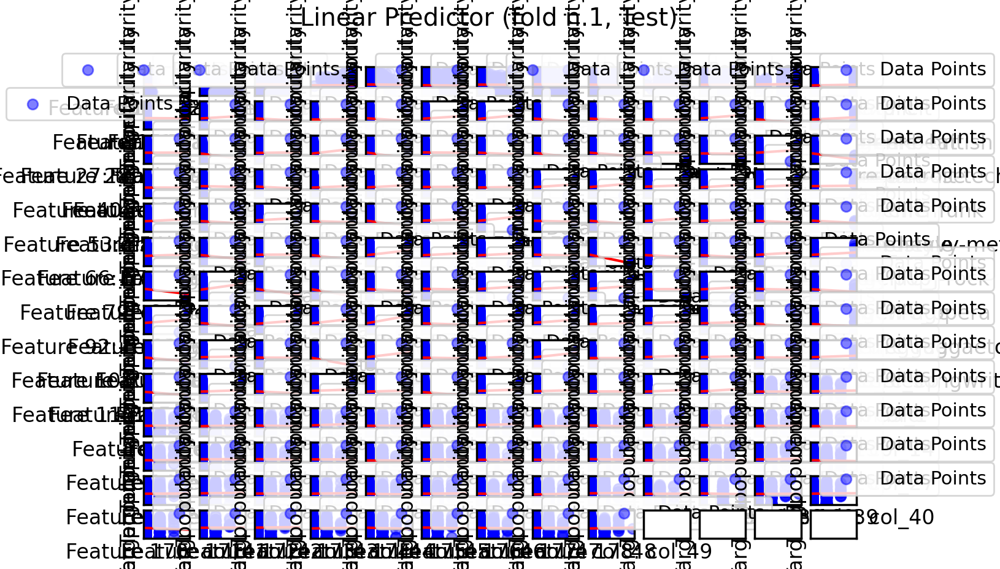


==========================Processing 1-th Fold==========================

----------------------Validate  1-th Fold with regularization: 0.01 -------------------------

----------------------Validate  1-th Fold with regularization: 100.68107382550336 -------------------------

----------------------Validate  1-th Fold with regularization: 201.3521476510067 -------------------------

----------------------Validate  1-th Fold with regularization: 302.02322147651006 -------------------------

----------------------Validate  1-th Fold with regularization: 402.6942953020134 -------------------------

----------------------Validate  1-th Fold with regularization: 503.3653691275168 -------------------------

----------------------Validate  1-th Fold with regularization: 604.0364429530201 -------------------------

----------------------Validate  1-th Fold with regularization: 704.7075167785235 -------------------------

----------------------Validate  1-th Fold with regularization: 805.37859

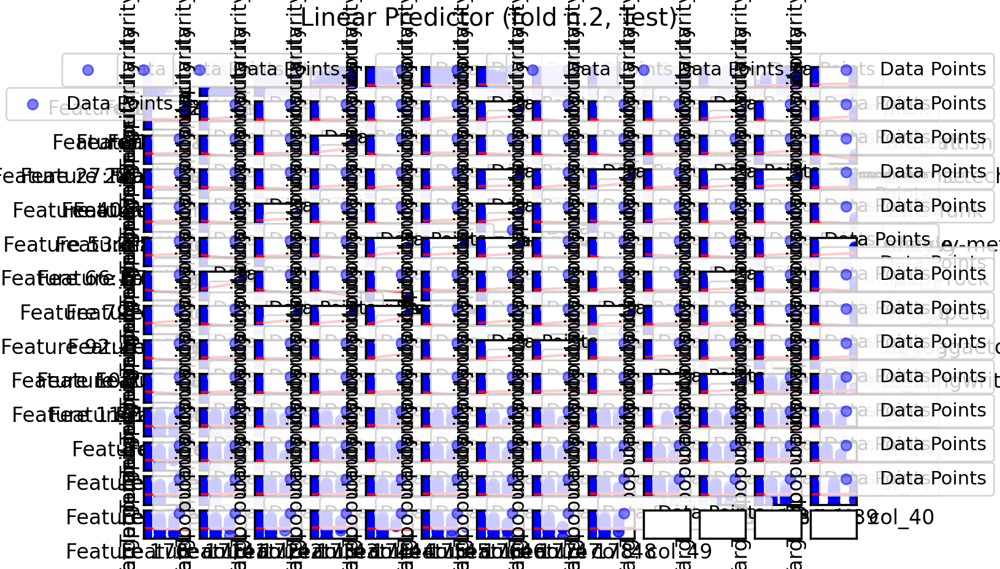


==========================Processing 2-th Fold==========================

----------------------Validate  2-th Fold with regularization: 0.01 -------------------------

----------------------Validate  2-th Fold with regularization: 100.68107382550336 -------------------------

----------------------Validate  2-th Fold with regularization: 201.3521476510067 -------------------------

----------------------Validate  2-th Fold with regularization: 302.02322147651006 -------------------------

----------------------Validate  2-th Fold with regularization: 402.6942953020134 -------------------------

----------------------Validate  2-th Fold with regularization: 503.3653691275168 -------------------------

----------------------Validate  2-th Fold with regularization: 604.0364429530201 -------------------------

----------------------Validate  2-th Fold with regularization: 704.7075167785235 -------------------------

----------------------Validate  2-th Fold with regularization: 805.37859

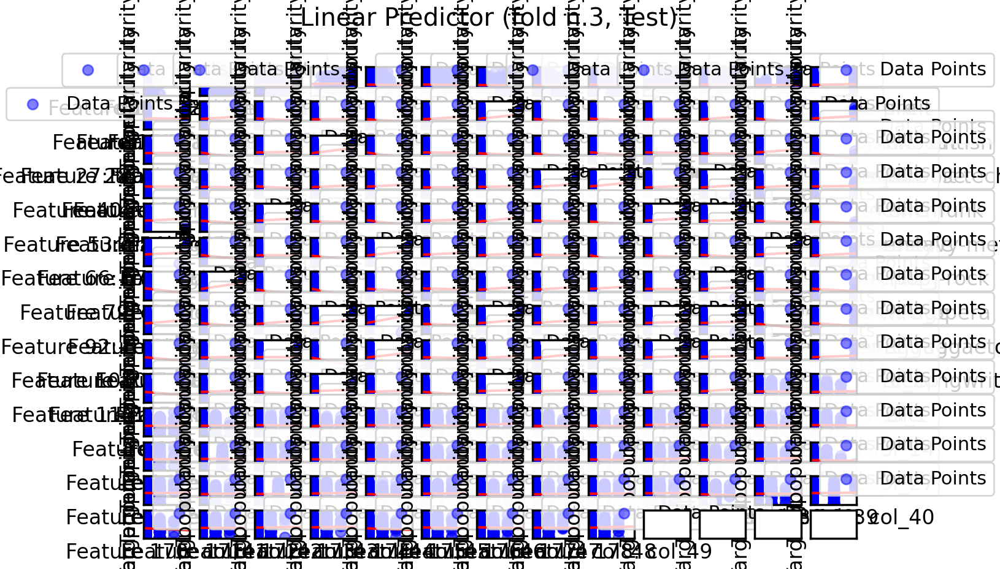


==========================Processing 3-th Fold==========================

----------------------Validate  3-th Fold with regularization: 0.01 -------------------------

----------------------Validate  3-th Fold with regularization: 100.68107382550336 -------------------------

----------------------Validate  3-th Fold with regularization: 201.3521476510067 -------------------------

----------------------Validate  3-th Fold with regularization: 302.02322147651006 -------------------------

----------------------Validate  3-th Fold with regularization: 402.6942953020134 -------------------------

----------------------Validate  3-th Fold with regularization: 503.3653691275168 -------------------------

----------------------Validate  3-th Fold with regularization: 604.0364429530201 -------------------------

----------------------Validate  3-th Fold with regularization: 704.7075167785235 -------------------------

----------------------Validate  3-th Fold with regularization: 805.37859

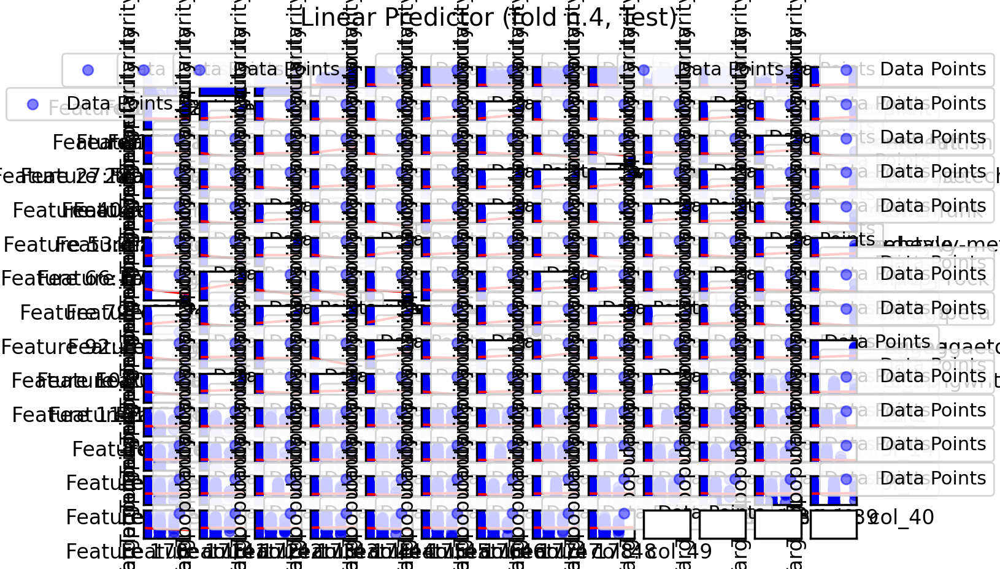


==========================Processing 4-th Fold==========================

----------------------Validate  4-th Fold with regularization: 0.01 -------------------------

----------------------Validate  4-th Fold with regularization: 100.68107382550336 -------------------------

----------------------Validate  4-th Fold with regularization: 201.3521476510067 -------------------------

----------------------Validate  4-th Fold with regularization: 302.02322147651006 -------------------------

----------------------Validate  4-th Fold with regularization: 402.6942953020134 -------------------------

----------------------Validate  4-th Fold with regularization: 503.3653691275168 -------------------------

----------------------Validate  4-th Fold with regularization: 604.0364429530201 -------------------------

----------------------Validate  4-th Fold with regularization: 704.7075167785235 -------------------------

----------------------Validate  4-th Fold with regularization: 805.37859

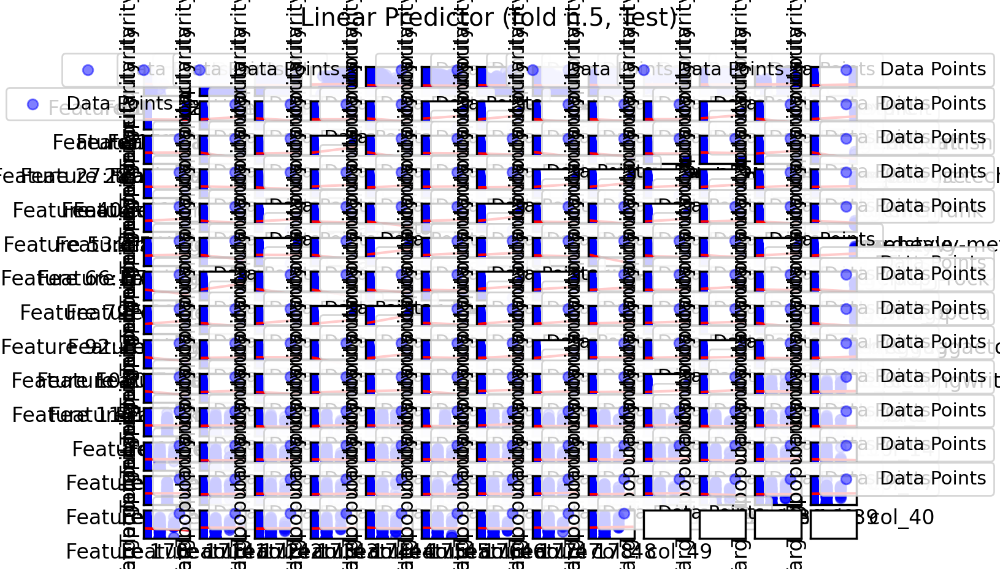

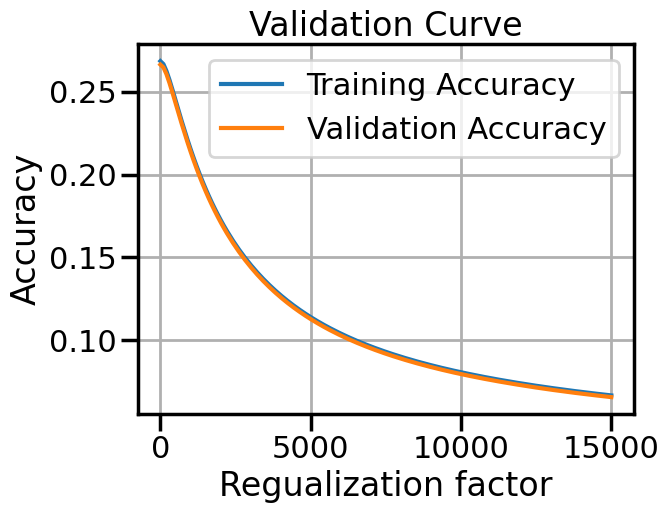

       Fold  Hyperparameter  Training_accuracy  Test_accuracy  \
0  Fold n.0            0.01           0.268734       0.265263   
1  Fold n.1            0.01           0.267839       0.268681   
2  Fold n.2            0.01           0.268352       0.266894   
3  Fold n.3            0.01           0.267919       0.268786   
4  Fold n.4            0.01           0.269493       0.262245   

   Exp. training acc. estimate  Accuracy estimate (Exp. stat. acc. estimate)  
0                     0.268467                                      0.266374  
1                     0.268467                                      0.266374  
2                     0.268467                                      0.266374  
3                     0.268467                                      0.266374  
4                     0.268467                                      0.266374  
       Fold       w_0       w_1       w_2       w_3       w_4       w_5  \
0  Fold n.0  0.015416 -0.006462  0.030061 -0.040364  0.03273

In [10]:
K = 5
hyper_space = np.linspace(0.01, 15000, num=150)
samples = 20
type = 'nestedKFoldCV'

encoders = {
    ('track_genre'): OneHotEncoder(sparse_output=False),
    ('artists', 'album_name', 'track_name'): ce.HashingEncoder(n_components=50)
}

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence', \
    'time_signature', 'key', 'artists', 'album_name', 'track_name'): StandardScaler()
}

features = features_continuous+features_categorical+features_multi_values+features_binary
tuning_validation = expectedRiskEstimate(K, RidgeRegression, scalers=scalers, encoders=encoders, features=features, \
                       target=target, evaluation=r2_score, verbose=True, visualize=False)
tuning_validation.learningCurveCV(X, y, hyper_space, type, samples)
tuning_validation.set_visualize(True)
tuning_validation.nestedKFoldCV(X, y, hyper_space)
tuning_validation.save(save_path)
tuning_validation.save_predictors(save_path)
optimal_alpha = tuning_validation.get_hyper_opt()

**TRAINING (Kernel ridge regression)**


==========================Create 0-th Fold==========================

==========================Create 1-th Fold==========================

==========================Create 2-th Fold==========================

==========================Create 3-th Fold==========================

==========================Create 4-th Fold==========================

==========================Pre-processing 0-th Fold==========================


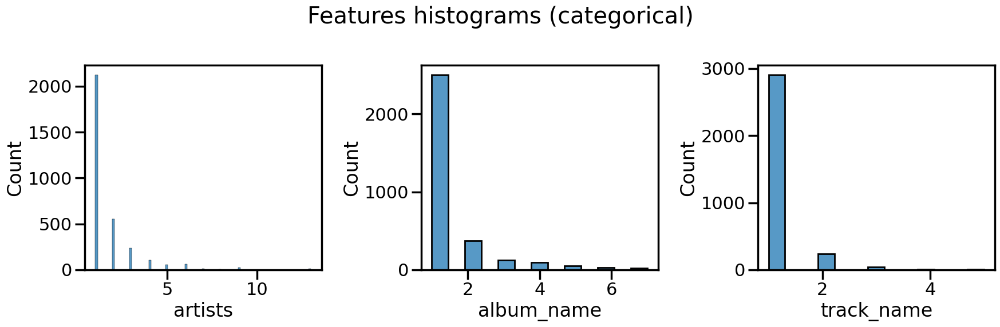

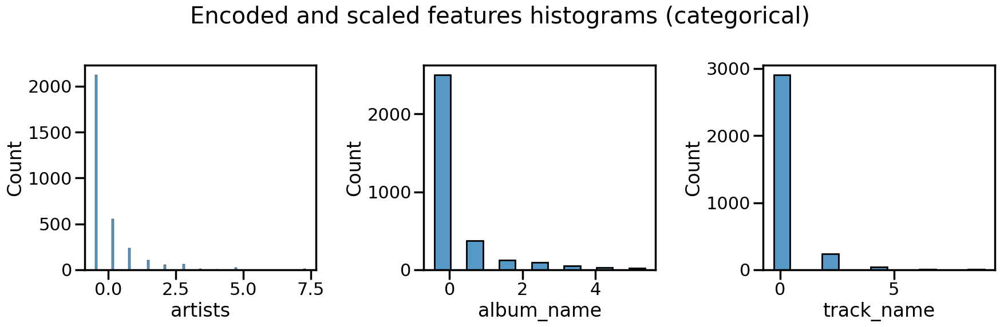

Output streaming troncato alle ultime 5000 righe.

----------------------Test  0-th Fold with regularization: [1.e-03 2.e+01] -------------------------

-------------------------------------Fitting Kernel Ridge Regression-------------------------

-------------------------------------Kernel matrix has been created--------------------------

-------------------------------------Inverse matrix has been computed------------------------

----------------------Test  1-th Fold with regularization: [1.e-03 2.e+01] -------------------------

-------------------------------------Fitting Kernel Ridge Regression-------------------------

-------------------------------------Kernel matrix has been created--------------------------

-------------------------------------Inverse matrix has been computed------------------------

----------------------Test  2-th Fold with regularization: [1.e-03 2.e+01] -------------------------

-------------------------------------Fitting Kernel Ridge Regression-----

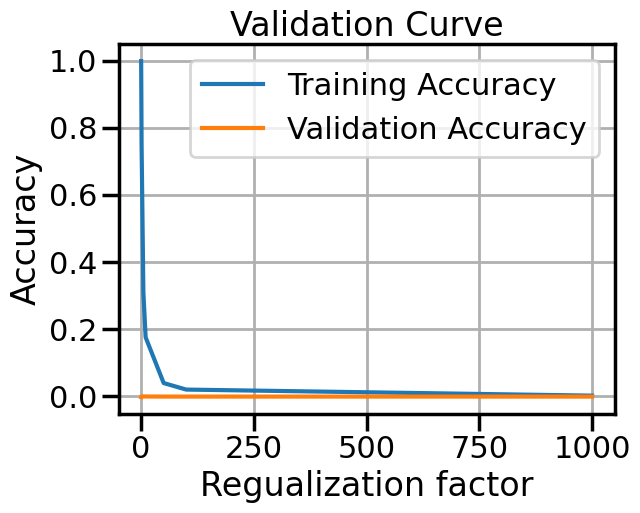

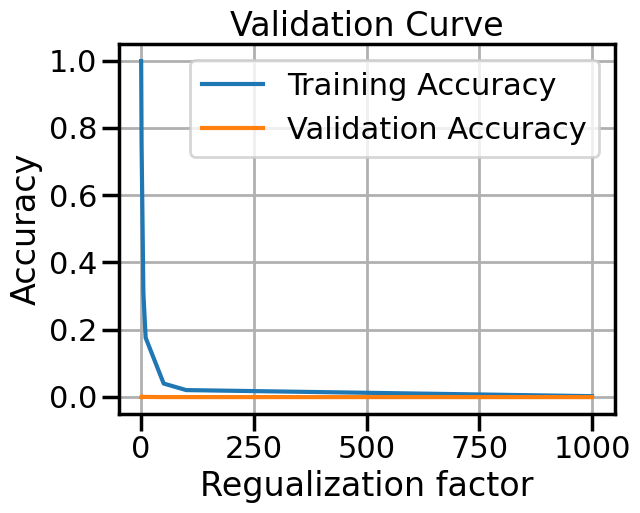

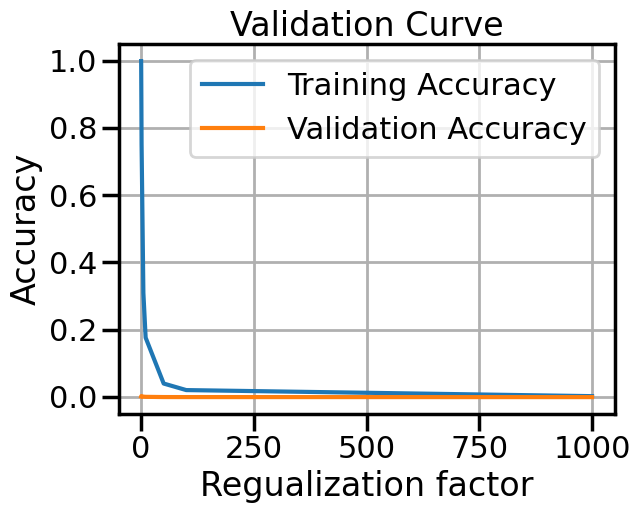

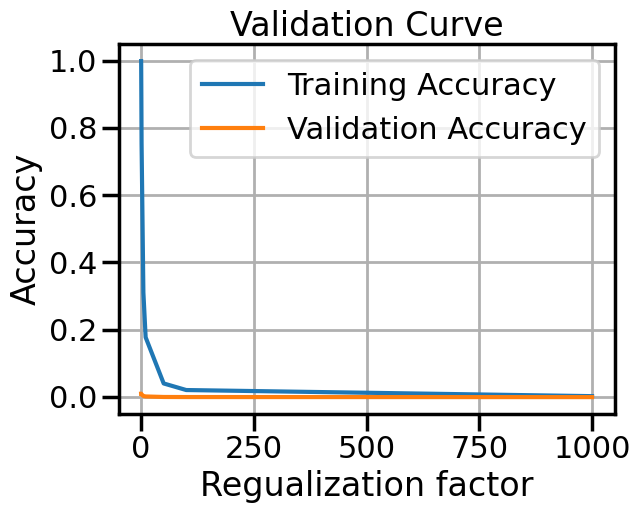

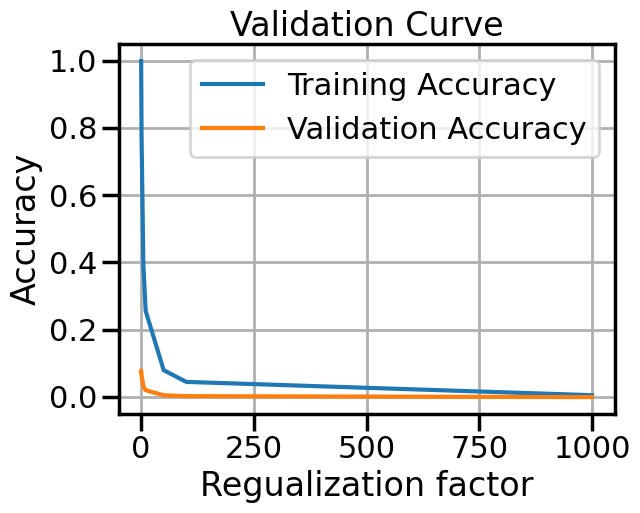

...

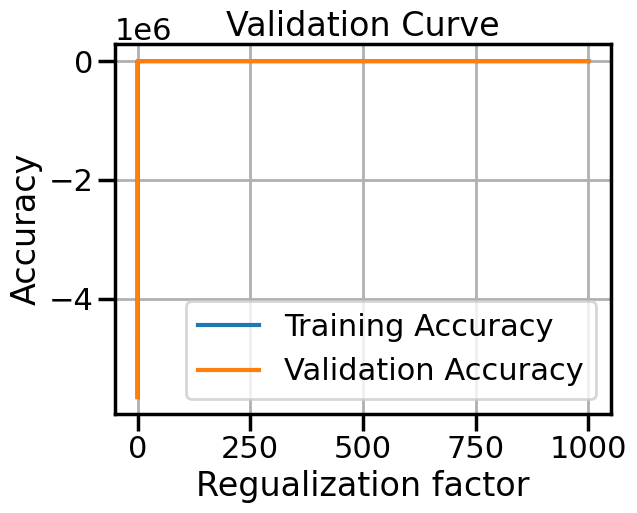

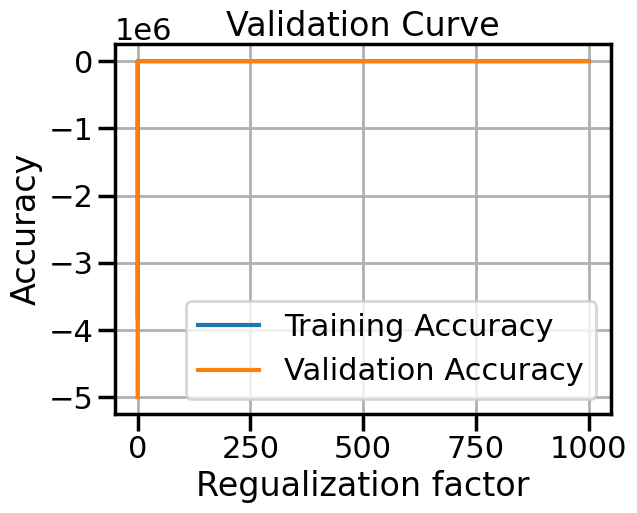

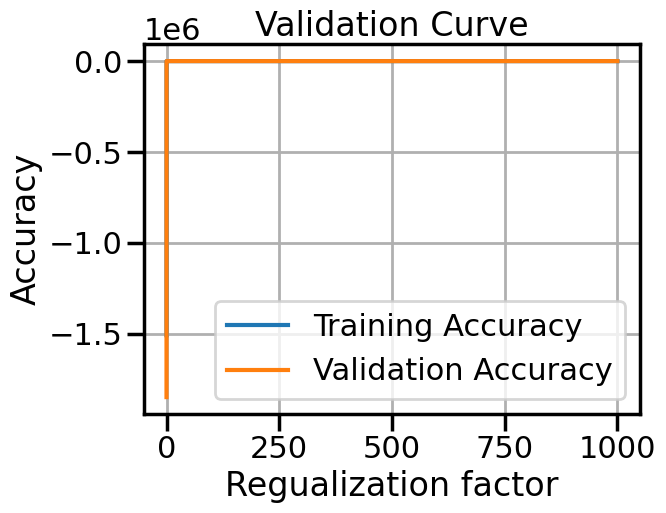

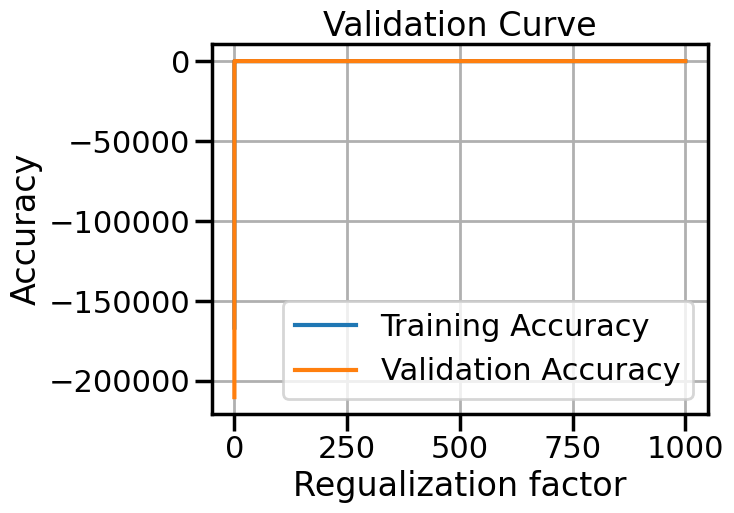

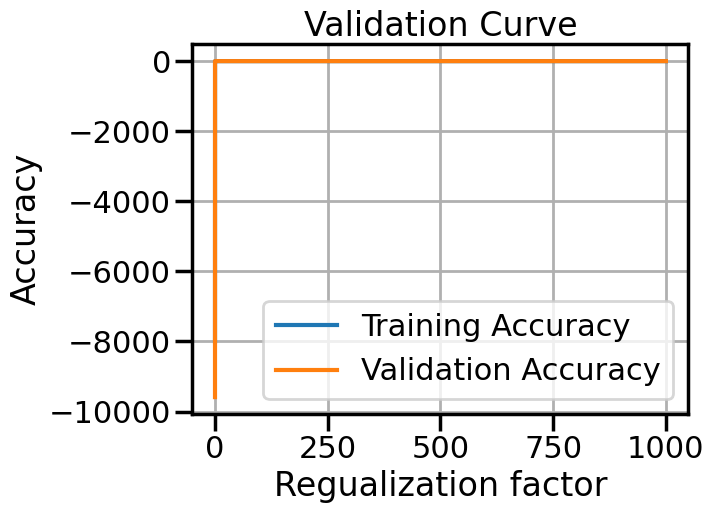

         Gamma  Alpha                                             Alphas  \
0      0.00001    1.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
1      0.00100    1.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
2      0.01000    0.5  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
3      0.10000    0.1  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
4      1.00000    0.1  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
5      2.00000    0.1  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
6      4.00000    1.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
7      5.00000    5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
8     10.00000    5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
9     15.00000    5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
10    20.00000    5.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
11    50.00000    1.0  [0.001, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0,...   
12   100.000

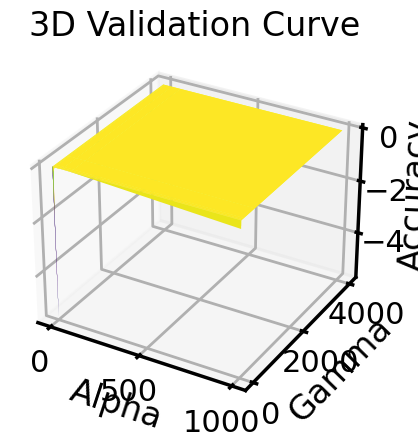

(0.40021468244939407,
 0.28569701500638445,
 array([ 5., 15.]),
 [array([-0.03532278,  0.0910405 , -0.09873119, ...,  0.15864398,
         -0.18358967, -0.0215942 ]),
  array([ 0.07276078, -0.31233933, -0.32360058, ...,  0.06735272,
         -0.19744223, -0.02764257]),
  array([ 0.04793791, -0.22758369, -0.41655653, ...,  0.13950941,
         -0.29013664, -0.03126931]),
  array([ 0.10877417, -0.30444894, -0.28684789, ...,  0.1209491 ,
         -0.21683698, -0.00397682]),
  array([ 0.10969332, -0.23512877, -0.33635552, ..., -0.33872946,
          0.04340189, -0.1524222 ])],
 3200)

In [12]:
save_path = './Results/Kernel/Categorical'

K = 5
alphas = np.array([0.001, 0.1, 0.5, 1,  5, 10, 50, 100, 1000])
gammas = np.array([0.00001, 0.001, 0.01, 0.1, 1, 2, 4, 5, 10, 15, 20, 50, 100, 500, 4000])
hyper_space = np.array(list(product(alphas, gammas)))

encoders = {
    ('track_genre'): TargetEncoding(target_col=target, encoding_type='mean', smoothing=5, default_shrink=3),
    ('artists', 'album_name', 'track_name'): ce.CountEncoder()
}

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence', \
     'artists', 'track_genre', 'time_signature', 'key', 'album_name', 'track_name'): StandardScaler()
}

X_red=X[:4000]
y_red=y[:4000]

features = features_continuous+features_categorical+features_multi_values+features_binary
best_cv = expectedRiskEstimate(K, KernelRidgeRegression, scalers=scalers, encoders=encoders, features=features, \
                        target=target, evaluation=r2_score, dc_applied=False, verbose=True, visualize=True)
best_cv.bestCV(X_red, y_red, hyper_space)

# **Kernel DC (categorical)**


==========================Create 0-th Fold==========================

==========================Create 1-th Fold==========================

==========================Create 2-th Fold==========================

==========================Create 3-th Fold==========================

==========================Create 4-th Fold==========================

==========================Pre-processing 0-th Fold==========================


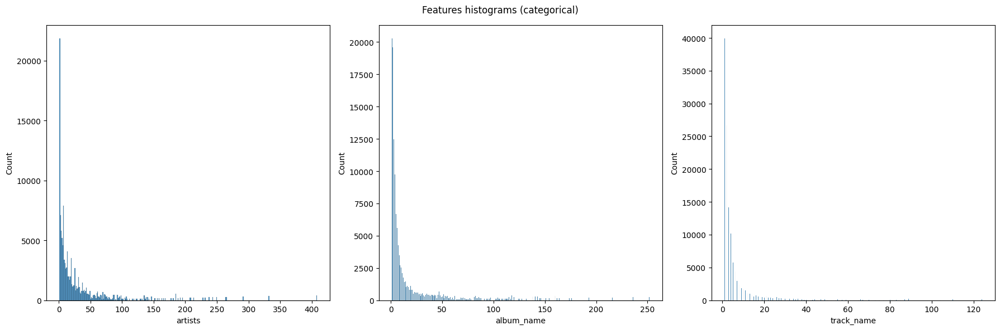

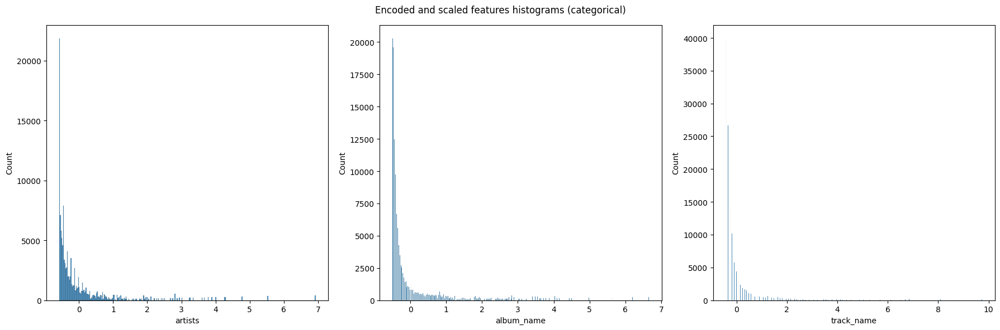

Output streaming troncato alle ultime 5000 righe.

--------------------------Score for submodel n. 31------------------------

--------------------------Score for submodel n. 32------------------------

--------------------------Score for submodel n. 33------------------------

--------------------------Score for submodel n. 34------------------------

--------------------------Score for submodel n. 35------------------------

=============================Score for Prediction n. 31370==========================

--------------------------Score for submodel n. 0------------------------

--------------------------Score for submodel n. 1------------------------

--------------------------Score for submodel n. 2------------------------

--------------------------Score for submodel n. 3------------------------

--------------------------Score for submodel n. 4------------------------

--------------------------Score for submodel n. 5------------------------

--------------------------Score f

In [ ]:
save_path = './Results/Kernel/Continuous'

K = 5
hyper_space = np.array([[5, 15]])

encoders = {
    ('track_genre'): TargetEncoding(target_col=target, encoding_type='mean', smoothing=5, default_shrink=3),
    ('artists', 'album_name', 'track_name'): ce.CountEncoder()
}

scalers = {
    ('duration_ms', 'loudness', 'tempo', 'popularity', 'energy', 'danceability', \
    'speechiness',  'acousticness', 'instrumentalness', 'liveness', 'valence', \
     'artists', 'track_genre', 'time_signature', 'key', 'album_name', 'track_name'): StandardScaler()
}

X_red=X[:157185]
y_red=y[:157185]

sample_tollerance = 3200
features = features_continuous+features_categorical+features_multi_values+features_binary
best_cv = expectedRiskEstimate(K, DCKRR, scalers=scalers, encoders=encoders, features=features, \
                        target=target, evaluation=r2_score, sample_tollerance=sample_tollerance, \
                        dc_applied=True, verbose=True, visualize=True)
best_cv.bestCV(X_red, y_red, hyper_space)
best_cv.save_best(save_path)
best_cv.save_predictors(save_path)


==========================Create 0-th Fold==========================

==========================Create 1-th Fold==========================

==========================Create 2-th Fold==========================

==========================Create 3-th Fold==========================

==========================Create 4-th Fold==========================

==========================Pre-processing 0-th Fold==========================


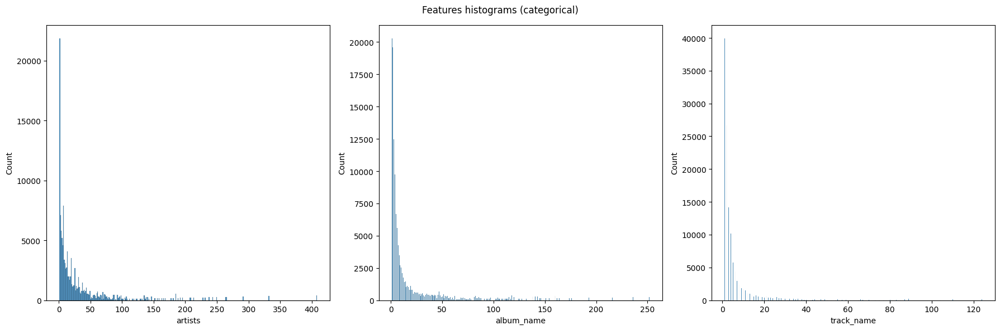

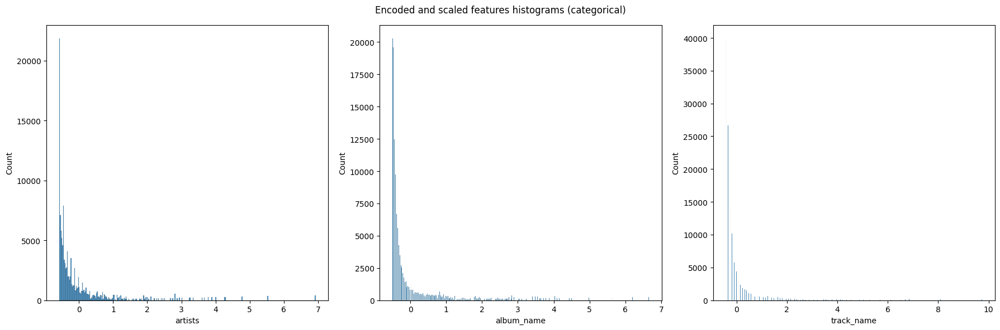

Output streaming troncato alle ultime 5000 righe.

--------------------------Score for submodel n. 4------------------------

--------------------------Score for submodel n. 5------------------------

--------------------------Score for submodel n. 6------------------------

--------------------------Score for submodel n. 7------------------------

--------------------------Score for submodel n. 8------------------------

--------------------------Score for submodel n. 9------------------------

--------------------------Score for submodel n. 10------------------------

--------------------------Score for submodel n. 11------------------------

--------------------------Score for submodel n. 12------------------------

--------------------------Score for submodel n. 13------------------------

--------------------------Score for submodel n. 14------------------------

--------------------------Score for submodel n. 15------------------------

--------------------------Score for submode

In [ ]:
sample_tollerance = 7000
features = features_continuous+features_categorical+features_multi_values+features_binary
best_cv = expectedRiskEstimate(K, DCKRR, scalers=scalers, encoders=encoders, features=features, \
                        target=target, evaluation=r2_score, sample_tollerance=sample_tollerance, \
                        dc_applied=True, verbose=True, visualize=True)
best_cv.bestCV(X_red, y_red, hyper_space)
best_cv.save_best(save_path)
best_cv.save_predictors(save_path)


==========================Create 0-th Fold==========================

==========================Create 1-th Fold==========================

==========================Create 2-th Fold==========================

==========================Create 3-th Fold==========================

==========================Create 4-th Fold==========================

==========================Pre-processing 0-th Fold==========================


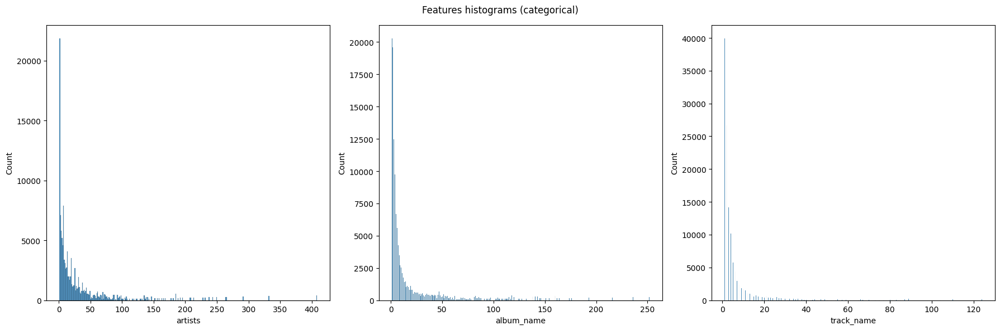

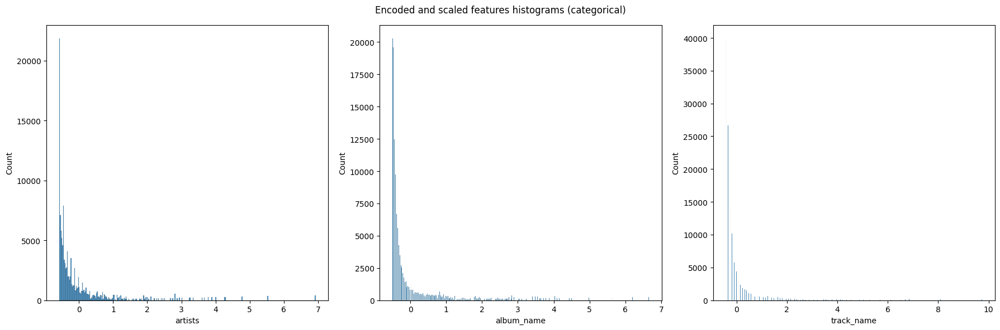

Output streaming troncato alle ultime 5000 righe.

--------------------------Score for submodel n. 11------------------------

=============================Score for Prediction n. 31246==========================

--------------------------Score for submodel n. 0------------------------

--------------------------Score for submodel n. 1------------------------

--------------------------Score for submodel n. 2------------------------

--------------------------Score for submodel n. 3------------------------

--------------------------Score for submodel n. 4------------------------

--------------------------Score for submodel n. 5------------------------

--------------------------Score for submodel n. 6------------------------

--------------------------Score for submodel n. 7------------------------

--------------------------Score for submodel n. 8------------------------

--------------------------Score for submodel n. 9------------------------

--------------------------Score for s

In [ ]:
sample_tollerance = 10000
features = features_continuous+features_categorical+features_multi_values+features_binary
best_cv = expectedRiskEstimate(K, DCKRR, scalers=scalers, encoders=encoders, features=features, \
                        target=target, evaluation=r2_score, sample_tollerance=sample_tollerance, \
                        dc_applied=True, verbose=True, visualize=True)
best_cv.bestCV(X_red, y_red, hyper_space)
best_cv.save_best(save_path)
best_cv.save_predictors(save_path)